In [1]:
import sys
# setting path
import os
new_directory = '/Users/eduard/Projects/PhD/numunutau/neutrino_ana/'
os.chdir(new_directory)
from scripts import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import ROOT as r
from array import array
from scipy.stats import gaussian_kde
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
sns.set_style("whitegrid")
# Constants for masses (in appropriate units)
m_mu = 0.105658  # Mass of the muon (in GeV)
m_numu = 0  # Neutrino masses are approximately zero
m_nutau = 0

/opt/anaconda3/envs/root_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [39]:
!ls -la 

total 1344
drwxr-xr-x@ 21 eduard  staff     672 Jul 29 14:20 .
drwxr-xr-x   4 eduard  staff     128 Jul 15 13:41 ..
-rw-r--r--@  1 eduard  staff   10244 Aug 15 13:19 .DS_Store
drwxr-xr-x@ 13 eduard  staff     416 Jul 22 20:54 .git
-rw-r--r--@  1 eduard  staff      15 Jul 15 13:24 README.md
drwxr-xr-x@ 17 eduard  staff     544 Aug 30 16:07 data
-rw-r--r--@  1 eduard  staff     146 Jul 21 14:37 gen_inhibit.py
-rw-r--r--   1 eduard  staff  597398 Jul 29 14:20 geofile_full.conical.MuonBack-TGeant4.root
drwxr-xr-x@  6 eduard  staff     192 Jul 15 14:53 input_flux
-rw-r--r--@  1 eduard  staff     426 Jul 15 13:24 launch.py
-rw-r--r--@  1 eduard  staff    2263 Sep 12 13:26 ml_part.py
drwxr-xr-x@ 12 eduard  staff     384 Sep 12 13:58 notebooks
-rw-r--r--@  1 eduard  staff    4072 Jul 21 14:37 output_inhibit.txt
drwxr-xr-x@ 28 eduard  staff     896 Sep  9 09:47 pics
-rw-r--r--@  1 eduard  staff    1108 Sep 11 16:53 process_dataset.py
drwxr-xr-x  19 eduard  staff     608 Aug 30 15:33 raw_data
-r

In [2]:
def gain_weights(Data, no_weights = False, experiment = "ship"):
    mu_weight, tau_weight = pd.read_csv(f"./input_flux/{experiment}_numu_flux.data", header = None, sep = "\s+"), pd.read_csv(f"./input_flux/{experiment}_nutau_flux.data", header = None, sep = "\s+")
    weight_relative = mu_weight[1].sum()/(tau_weight[1].sum() / 5.)
    Data["mu"]["weight"] = weight_relative if not no_weights else 1.
    Data["tau"]["weight"] = 1.

def read_data(files, integrated_weighting = True, experiment = "ship"):

    Data = {}
    print("Reading raw GENIE output...")
    for i, part in enumerate(["mu", "tau"]):
        Data[part] = pd.read_csv(f"./raw_data/{files[i]}", header = None, sep = "\s+")
        Data[part].columns = ["Event", "Number", "id", "m_id", "name", "px", "py", "pz", "E", "final", "Xin", "Yin", "Zin"]
        # Identify double events
        #double_events = Data[part].query("id == 13")[["Event", "id"]].value_counts().reset_index().query("count == 1")["Event"]
        double_events = pd.read_csv(f"./data/bad_events_{part}.csv")["Event"]
        # Filter out double events
        Data[part] = Data[part][~Data[part]["Event"].isin(double_events)]
        
    return Data, double_events
    


def read_IP_data():
    Data_0 = {}
    for part in ["mu", "tau"]:
        # Load the data
        Data_0[part] = pd.read_csv(f"./raw_data/Track_Output_CC_tauhadron_3cm_{part}_29082024", header=None, sep="\s+").dropna()
        Data_0[part].columns = ["Event", "plane", "id", "Ekin_in", "x", "y", "z", "px", "py", "pz", "Ekin_post"]
        
        # Identify double events
        double_events = Data_0[part].query("plane == 0 & id == 13")[["Event", "id"]].value_counts().reset_index().query("count == 2")["Event"]
        print(double_events.sort_values())
        double_events.sort_values().reset_index().to_csv(f"./data/bad_events_500k_{part}.csv")
        # Filter out double events
        Data_0[part] = Data_0[part][~Data_0[part]["Event"].isin(double_events)]
        
        # Add label for the particle type
        Data_0[part]["label"] = f"nu{part}"
    return Data_0
    # Data_0


files_ship_tau_decayed = ["output_nu_mu_100k_fe_taudecayed_charm_cc", "output_nu_tau_100k_fe_taudecayed_charm_cc"]
files_ship_geant4 = ["out_nu_mu_100k_fe_taudecayed_charm_cc_ana", "out_nu_tau_100k_fe_charm_cc_ana"]
files_ship_geant4 = ["out_nu_mu_500k_fe_taudecayed_charm_cc_ana", "out_nu_tau_500k_fe_charm_cc_ana"]
df_geant4, double_events = read_data(files_ship_geant4)
#df_geant4_IP = read_IP_data()
gain_weights(df_geant4)
#df_geant4 = pd.concat([df_geant4["mu"], df_geant4["tau"]])
#df_genie, _ = read_data(files_ship_tau_decayed)
#gain_weights(df_genie)
#df_genie = pd.concat([df_genie["mu"], df_genie["tau"]])
df_geant4["mu"]["label"] = "numu"
df_geant4["tau"]["label"] = "nutau"

Reading raw GENIE output...


In [5]:
out = df_geant4_IP["tau"].query("plane == 0 & id == 13")[["Event", "Ekin_in"]].merge(df_geant4["tau"].query("name == 'tau-'")[["Event", "E"]], 
                          left_on="Ekin_in", right_on="E", suffixes=('_IP', '_genie'))
out_events = out.loc[out["Event_IP"] == out["Event_genie"]]["Event_IP"]
taus = df_geant4["tau"].query("name == 'tau-'")[["Event", "E"]]
taus = taus.loc[taus["Event"].isin(out_events)]
taus_IP = df_geant4_IP["tau"].query("plane == 0 & id == 13")[["Event", "Ekin_in"]]
taus_IP = taus_IP.loc[taus_IP["Event"].isin(out_events)]
out_mu = df_geant4_IP["mu"].query("plane == 0 & id == 13")[["Event", "Ekin_in"]].merge(df_geant4["mu"].query("name == 'mu-'")[["Event", "E"]], 
                          left_on="Ekin_in", right_on="E", suffixes=('_IP', '_genie'))
out_mu_events = out_mu.loc[out_mu["Event_IP"] == out_mu["Event_genie"]]["Event_IP"]
taus_mu = df_geant4["mu"].query("name == 'mu-'")[["Event", "E"]]
taus_mu = taus_mu.loc[taus_mu["Event"].isin(out_mu_events)]
taus_mu_IP = df_geant4_IP["mu"].query("plane == 0 & id == 13")[["Event", "Ekin_in"]]
taus_mu_IP = taus_mu_IP.loc[taus_mu_IP["Event"].isin(out_mu_events)]

In [71]:
extract_IP("out_IP_mu_3cm_planes_500k.csv")

,Event,px,py,pz,E,IP,weight
0,0,-2.952162,-1.295885,32.178738,32.339856,0.005410,1.0
1,1,-2.239126,0.132467,42.506953,42.566098,0.003130,1.0
2,2,-0.460824,-0.212179,19.477545,19.484161,0.006728,1.0
3,3,-1.872881,-3.237814,29.496605,29.732832,0.004378,1.0
4,4,-1.613089,1.376495,7.157466,7.465063,0.024509,1.0
...,...,...,...,...,...,...,...
327773,329533,-1.331507,-0.486159,61.422650,61.439007,0.001841,1.0
327774,329534,-0.095226,0.638267,4.288590,4.336906,0.018383,1.0
327775,329535,0.757405,-0.065151,7.891508,7.928094,0.027518,1.0
327776,329536,6.173030,0.438830,33.780222,34.342435,0.005810,1.0


# Construct the histograms for different weightings

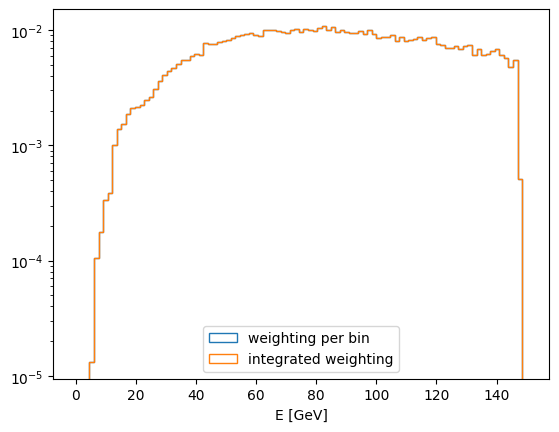

In [14]:
# construct the histograms for different weightings
fig, ax = plt.subplots()
numu_perbin_weights = ml_pipe.Data["tau"].query("id == 16 & m_id == -1")
numu_integrated_weights = ml_pipe_int_weighting.Data["tau"].query("id == 16 & m_id == -1")
bins = np.linspace(0, 150, 100)
ax.hist(numu_perbin_weights["E"], 
        #weights = numu_perbin_weights["weight"], 
        bins = bins, 
        histtype = "step", 
        density = True,
        label = "weighting per bin")
ax.hist(numu_integrated_weights["E"], 
        #weights = numu_integrated_weights["weight"], 
        bins = bins, 
        histtype = "step", 
        density = True,
        label = "integrated weighting")
ax.set_xlabel("E [GeV]")
ax.set_yscale("log")
ax.legend()

# Check the tau distribution

In [218]:
df_geant4["tau"].reset_index().query("name == 'tau-'").iloc[170:190]["E"]

5393     23.31330
5436     29.57470
5474     51.14610
5508      9.54190
5519     39.38700
5554     19.59210
5610      9.00835
5644     80.57430
5673    107.02000
5687      7.48686
5718     17.53870
5747     47.06260
5794     23.57110
5818     58.02490
5849     37.67340
5886     42.81190
5917     41.51650
5966     49.59130
5990     72.78800
6006     37.30300
Name: E, dtype: float64

# Comparing the strings and visible showers

In [314]:
def extract_string(df):
    strings = df.query(f"id == 2000000001")
    #strings.columns = [col + "_string" for col in strings.columns]
    return strings[["Event", "px", "py", "pz", "E"]]


def extract_showers(df_0, cut_on_p = None, neutrals = []):
    nu_flavor = df_0.query("m_id == -1")["id"].iloc[0]
    df = df_0.copy()
    df["p"] = np.sqrt(df["px"]**2 + df["py"]**2 + df["pz"]**2)
    if cut_on_p:
        df = df.query(f"p > {cut_on_p}")
    hadrons = df.loc[~df.name.isin(neutrals)].query(f"final == 1 & id != 13 & id != 15").drop(columns = ["name"]).groupby("Event").sum().reset_index()
    #hadrons.columns = [col + "_hadr" for col in hadrons.columns]

    return hadrons[["Event", "px", "py", "pz", "E"]]

def extract_muons(df, label = None):
    muons = df.query(f"id == 13 & m_id == {0 if label == "numu" else 4}")
    #muons.columns = [col + "_mu" for col in muons.columns]
    return muons[["Event", "px", "py", "pz", "E", "weight"]]

def extract_IP(out_file):
    out_IP = pd.read_csv(f"data/{out_file}").drop(columns = ['Unnamed: 0'])
    # df = df.merge(out_IP, how = "inner", left_on = "Event", right_on = "Event_mu_IP")
    # muons_tau["E_mu_old"] = muons_tau["E_mu"]
    # muons_tau["px_mu_old"] = muons_tau["px_mu"]
    # muons_tau["py_mu_old"] = muons_tau["py_mu"]
    # muons_tau["pz_mu_old"] = muons_tau["pz_mu"]
    # muons_tau["E_mu"] = muons_tau["E_mu_IP"]
    # muons_tau["px_mu"] = muons_tau["px_mu_IP"]
    # muons_tau["py_mu"] = muons_tau["py_mu_IP"]
    # muons_tau["pz_mu"] = muons_tau["pz_mu_IP"]
    out_IP.columns = [col.split("_")[0] for col in out_IP.columns]
    if "tau" in out_file:
        out_IP["weight"] = 1.
    else:
        out_IP["weight"] = 303.459225      
    return out_IP[["Event", "px", "py", "pz", "E", "IP", "weight"]]

def construct_params(df_muon, smearing = False):
    if smearing:
        df_muon["E_hadr"] = np.random.normal(df_muon["E_hadr"], 0.2*df_muon["E_hadr"])
        df_muon["E_mu"] = np.random.normal(df_muon["E_mu"], 0.15*df_muon["E_mu"])
        df_muon["px_mu"] = np.random.normal(df_muon["px_mu"], 0.09*np.abs(df_muon["px_mu"]))
        df_muon["py_mu"] = np.random.normal(df_muon["py_mu"], 0.09*np.abs(df_muon["py_mu"]))
    p_muon = np.sqrt(df_muon["px_mu"]**2 + df_muon["py_mu"]**2 + df_muon["pz_mu"]**2)
    p_hadr = np.sqrt(df_muon["px_hadr"]**2 + df_muon["py_hadr"]**2 + df_muon["pz_hadr"]**2)
    df_muon["px_hadr"] = (df_muon["E_hadr"]/p_hadr)*df_muon["px_hadr"]
    df_muon["py_hadr"] = (df_muon["E_hadr"]/p_hadr)*df_muon["py_hadr"]
    df_muon["pz_hadr"] = (df_muon["E_hadr"]/p_hadr)*df_muon["pz_hadr"]
    p_hadr = np.sqrt(df_muon["px_hadr"]**2 + df_muon["py_hadr"]**2 + df_muon["pz_hadr"]**2)
    
    df_muon["px_miss"] = -df_muon["px_mu"].values - df_muon["px_hadr"].values
    df_muon["py_miss"] = -df_muon["py_mu"].values - df_muon["py_hadr"].values
    df_muon["Pt_miss"] = np.sqrt(df_muon["px_miss"]**2 + df_muon["py_miss"]**2)
    #df_muon["pz_miss"] = df_muon["P_nu"].values - df_muon["pz_mu"].values - df_muon["pz_hadr"].values
    #df_muon["P_miss"] = np.sqrt(df_muon["px_miss"]**2 + df_muon["py_miss"]**2 + df_muon["pz_miss"]**2)
    
    

    muon_sin = np.sqrt(df_muon["px_mu"].values**2 + df_muon["py_mu"].values**2)/np.sqrt(df_muon["px_mu"].values**2 + df_muon["py_mu"].values**2 + df_muon["pz_mu"].values**2)
    hadr_sin = np.sqrt(df_muon["px_hadr"].values**2 + df_muon["py_hadr"].values**2)/np.sqrt(df_muon["px_hadr"].values**2 + df_muon["py_hadr"].values**2 + df_muon["pz_hadr"].values**2)
    #df_muon["Pt_miss"] = np.abs(df_muon["E_hadr"].values*hadr_sin - p_muon.values*muon_sin)
    #df_muon["Pt_miss"] = df_muon["E_hadr"].values*hadr_sin - df_muon["E_mu"].values*muon_sin
    df_muon["Pt_hadr"] = df_muon["E_hadr"].values*hadr_sin
    df_muon["Pt_mu"] = df_muon["E_mu"].values*muon_sin


    #df_muon["Pt_miss_old"] = np.sqrt(df_muon["px_miss"]**2 + df_muon["py_miss"]**2)
    #df_muon["Pt_miss"] = df_muon["Pt_miss_old"]
    df_muon["Pt_mu_old"] = np.sqrt(df_muon["px_mu"]**2 + df_muon["py_mu"]**2)
    df_muon["P_mu_old"] = np.sqrt(df_muon["px_mu"]**2 + df_muon["py_mu"]**2 + df_muon["pz_mu"]**2)
    df_muon["Pt_hadr_old"] = np.sqrt(df_muon["px_hadr"]**2 + df_muon["py_hadr"]**2)
    df_muon["P_hadr_old"] = np.sqrt(df_muon["px_hadr"]**2 + df_muon["py_hadr"]**2 + df_muon["pz_hadr"]**2)


    # df_muon["Pt_miss"] = np.abs(df_muon["E_hadr"].values*hadr_sin - df_muon["E_mu"].values*muon_sin)
    # df_muon["Pt_hadr"] = df_muon["E_hadr"].values*hadr_sin
    # df_muon["Pt_mu"] = df_muon["E_mu"].values*muon_sin

    # df_muon["Pt_miss"] = df_muon["Pt_miss_old"]
    # df_muon["Pt_hadr"] = df_muon["Pt_hadr_old"]
    # df_muon["Pt_mu"] = df_muon["Pt_mu_old"]

    # df_muon["Pt_miss/E_mu"] = df_muon["Pt_miss"]/df_muon["E_mu"]
    # df_muon["Pt_miss/E_hadr"] = df_muon["Pt_miss"]/df_muon["E_hadr"]
    # df_muon["Pt_miss/Pt_mu"] = df_muon["Pt_miss"]/df_muon["Pt_mu"]
    # df_muon["Pt_miss/Pt_hadr"] = df_muon["Pt_miss"]/df_muon["Pt_hadr"]
    # df_muon["E_mu/E_hadr"] = df_muon["E_mu"]/df_muon["E_hadr"]
    # df_muon["Pt_mu/Pt_hadr"] = df_muon["Pt_mu"]/df_muon["Pt_hadr"]
    # df_muon["Pt_mu/E_hadr"] = df_muon["Pt_mu"]/df_muon["E_hadr"]
    # df_muon["Pt_hadr/E_mu"] = df_muon["Pt_hadr"]/df_muon["E_mu"]

    # df_muon["Pt_missxE_mu"] = df_muon["Pt_miss"]*df_muon["E_mu"]

    # df_muon["E_mu/Pt_miss"] = df_muon["E_mu"]/df_muon["Pt_miss"]
    # df_muon["E_hadr/Pt_miss"] = df_muon["E_hadr"]/df_muon["Pt_miss"]
    # df_muon["Pt_miss/Pt_mu"] = df_muon["Pt_miss"]/df_muon["Pt_mu"]
    # df_muon["Pt_hadr/Pt_miss"] = df_muon["Pt_hadr"]/df_muon["Pt_miss"]
    # df_muon["E_hadr/E_mu"] = df_muon["E_hadr"]/df_muon["E_mu"]
    # df_muon["Pt_hadr/Pt_mu"] = df_muon["Pt_hadr"]/df_muon["Pt_mu"]


    df_muon["anglePtmissandPtmuon"] = np.arccos((-df_muon["px_miss"].values*df_muon["px_mu"].values - df_muon["py_miss"].values*df_muon["py_mu"].values)/(df_muon["Pt_miss"].values*df_muon["Pt_mu_old"].values))
    df_muon["anglePtmissandPthadr"] = np.arccos((-df_muon["px_miss"]*df_muon["px_hadr"] - df_muon["py_miss"]*df_muon["py_hadr"])/(df_muon["Pt_miss"]*df_muon["Pt_hadr"]))
    df_muon["anglePtmuonandPthadr"] = np.arccos((-df_muon["px_mu"]*df_muon["px_hadr"] - df_muon["py_mu"]*df_muon["py_hadr"])/(df_muon["Pt_mu_old"]*df_muon["Pt_hadr"]))

    # df_muon["anglePtmissandPtmuon"] = np.arccos()


    df_muon["anglePtmissandPtmuon"] = 180*df_muon["anglePtmissandPtmuon"]/np.pi
    df_muon["anglePtmissandPthadr"] = 180*df_muon["anglePtmissandPthadr"]/np.pi
    df_muon["anglePtmuonandPthadr"] = 180*df_muon["anglePtmuonandPthadr"]/np.pi


    #df_muon["Pt_mu_on_Pt_miss"] = (df_muon["px_miss"]*df_muon["px_mu"] + df_muon["py_miss"]*df_muon["py_mu"])/df_muon["Pt_miss"]
    #df_muon["Pt_hadr_on_Pt_miss"] = (df_muon["px_miss"]*df_muon["px_hadr"] + df_muon["py_miss"]*df_muon["py_hadr"])/df_muon["Pt_miss"]
    df_muon["anglePhadrandPmuon"] = np.arccos((df_muon["px_hadr"]*df_muon["px_mu"] + df_muon["py_hadr"]*df_muon["py_mu"] + df_muon["pz_hadr"]*df_muon["pz_mu"])/(p_muon*p_hadr))

    df_muon["anglePhadrandPmuon"] = 180*df_muon["anglePhadrandPmuon"]/np.pi



# Your decay function for a single tau lepton
def setdecay_df_single_3body(data):
    tau_lepton = r.TLorentzVector(array('f', data))
    event = r.TGenPhaseSpace()
    event.SetDecay(tau_lepton, 3, np.asarray([m_mu, m_numu, m_nutau]))
    event.Generate()
    # Extract 4-momentum for the muon (decay product with index 0)
    return [event.GetDecay(0).Px(), event.GetDecay(0).Py(), event.GetDecay(0).Pz(), event.GetDecay(0).E()]

# Function to decay taus and return muons with other columns preserved
def decay_tau_leptons(df):
    # Filter for tau leptons (id == 15)
    taus = df[df['id'] == 15].copy()
    
    # Apply the decay function to each tau lepton to get the corresponding muon
    taus[['px', 'py', 'pz', 'E']] = taus[['px', 'py', 'pz', 'E']].apply(
        lambda row: pd.Series(setdecay_df_single_3body([row['px'], row['py'], row['pz'], row['E']])),
        axis=1
    )
    
    # Change the id to 13 for muons
    taus['id'] = 13
    taus['name'] = 'muon'  # Update the name column
    
    # Return the new DataFrame of muons with the other columns unchanged
    return taus



def extract_info(df, neutrals = [], p_cut = None, IP = True, ideal = False, planes = "", big_stat = False):
    # neutrals = [
    #             #"neutron", "antineutron", "proton", "antiproton", 
    #             #'nu_e_bar', 'nu_e', 'nu_mu_bar', 'nu_mu', 'nu_tau', 'nu_tau_bar', 
    #     #'mu'
    #             ]
    if IP and not big_stat:
        df_mu = df["mu"].loc[df["mu"]["Event"].isin(out_mu_events)] 
        df_tau = df["tau"].loc[df["tau"]["Event"].isin(out_events)] 
    else:
        df_mu = df["mu"]
        df_tau = df["tau"]

    strings_mu = extract_string(df_mu)
    strings_tau = extract_string(df_tau)
    if ideal:
        hadrons_mu = extract_string(df_mu)
        hadrons_tau = extract_string(df_tau)
    else:
        hadrons_mu = extract_showers(df_mu, neutrals = neutrals, cut_on_p = p_cut)
        hadrons_tau = extract_showers(df_tau, neutrals = neutrals, cut_on_p = p_cut)
    muons_mu = extract_muons(df_mu, "numu")
    if IP:
        muons_tau = extract_muons(df_tau)
    else:
        # Example usage
        # Assuming `df` is your original DataFrame with all particles
        # You can now get the DataFrame of muons from tau decays
        muons_tau = decay_tau_leptons(df_tau)

    out_file_mu = f"out_IP_mu_3cm{planes}.csv"
    out_file_tau = f"out_IP_tau_3cm{planes}.csv"
    if big_stat:
        out_file_mu = f"out_IP_mu_3cm_planes_500k.csv"
        out_file_tau = f"out_IP_tau_3cm_planes_500k.csv"        
    muons_mu_IP = extract_IP(out_file_mu)
    muons_tau_IP = extract_IP(out_file_tau)
    IP_mu_len = len(muons_mu_IP)
    IP_tau_len = len(muons_tau_IP)
    if IP:
        muons_mu = muons_mu_IP
        muons_tau = muons_tau_IP
    # else:
    #     muons_mu = muons_mu.iloc[:IP_mu_len]
    #     muons_tau = muons_tau.iloc[:IP_tau_len]
    mu_data = muons_mu.merge(hadrons_mu, on="Event", suffixes=('_mu', '_hadr'))
    mu_data["label"] = "numu"
    tau_data = muons_tau.merge(hadrons_tau, on="Event", suffixes=('_mu', '_hadr'))
    tau_data["label"] = "nutau"
    df_1 = pd.concat([mu_data, tau_data])
    return df_1

def plot_comp_histograms(df_mu, df_tau, labels = [], param = "E", weights = False):
    fig, ax = plt.subplots()
    bins = np.linspace(min(df_mu[param].min(), df_tau[param].min()), max(df_mu[param].max(), df_tau[param].max()), 100)
    ax.hist(df_mu[param], 
            bins = bins, 
            histtype = "step", 
            density = True,
            label = "mu" if labels == [] else labels[0])
    ax.hist(df_tau[param],  
            bins = bins, 
            histtype = "step", 
            density = True,
            label = "tau" if labels == [] else labels[1])
    ax.set_xlabel(f"{param}")
    ax.set_yscale("log")
    ax.legend()    

def plot_hist(df, labels = [], param = "Pt_miss"):
    fig, ax = plt.subplots()
    df_mu = df.loc[df.label == "numu"]
    df_tau = df.loc[df.label == "nutau"]
    #bins = np.linspace(min(df_mu[param].min(), df_tau[param].min()), max(df_mu[param].max(), df_tau[param].max()), 100)
    bins = np.logspace(np.log10(min(df_mu[param].min(), df_tau[param].min())), np.log10(max(df_mu[param].max(), df_tau[param].max())), 200)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.hist(df_mu[param], 
            bins = bins, 
            histtype = "step", 
            #density = True,
            label = "mu" if labels == [] else labels[0])
    ax.hist(df_tau[param],  
            bins = bins, 
            histtype = "step", 
            #density = True,
            label = "tau" if labels == [] else labels[1])
    ax.set_xlabel(f"{param}")
    ax.set_yscale("log")
    ax.legend()    

def plot_density(df, label="label", params=[], height=6, dpi=100):
    # Create the jointplot with a specified height
    g = sns.jointplot(data=df, x=params[0], y=params[1], hue=label, height=height)

    # Adjust the DPI (resolution) of the jointplot
    g.fig.set_dpi(dpi)
    
    # Show the plot
    plt.show()

def plot_hist2d(df, label = "label", params = []):
    fig, ax = plt.subplots()
    bins_x = np.linspace(min(df[param[0]].min(), df[param[0]].min()), max(df_mu[param].max(), df_tau[param].max()), 100)
    bins_y = np.linspace(min(df_mu[param].min(), df_tau[param].min()), max(df_mu[param].max(), df_tau[param].max()), 100)
    sns.kdeplot(
    data=df, x=params[0], y=params[1], hue=label, 
        #fill=True,
    )

In [82]:
neutrals = []
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = False, planes = "", IP=True, p_cut=0.5, big_stat = True).dropna(axis = 1)
construct_params(df_1_geant4)

<Axes: >

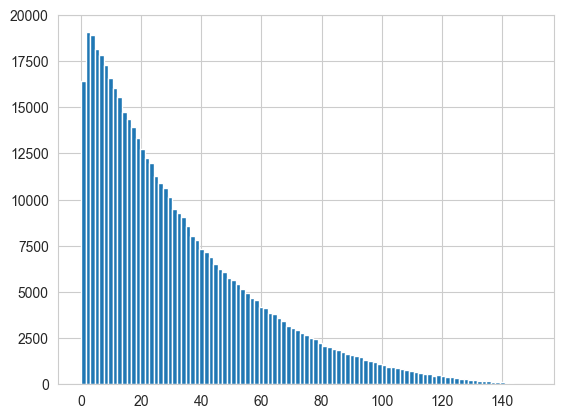

In [5]:
df_geant4["mu"].query("id == 13")["E"].hist(bins = np.linspace(0,150,100))

<Axes: >

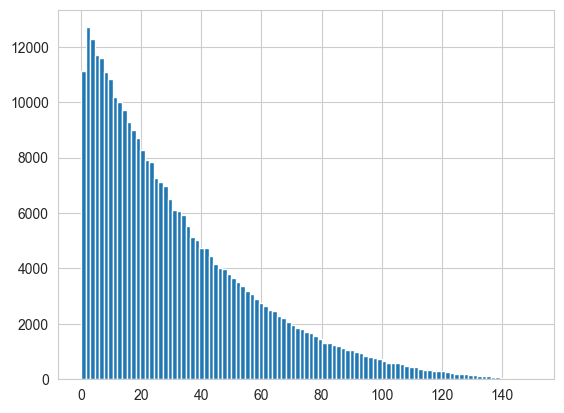

In [6]:
df_1_geant4.query("label == 'numu'")["E_mu"].hist(bins = np.linspace(0,150,100))

In [71]:
events_mu = df_1_geant4.query("label == 'numu'")["Event"]
subtract = (df_geant4["mu"].query("id == 13").drop_duplicates(subset=['Event']).loc[df_geant4["mu"].query("id == 13")["Event"].isin(events_mu)].reset_index()["E"] - df_1_geant4.query("label == 'numu'")["E_mu"])

In [58]:
ev_dev = df_geant4["mu"].query("id == 13").drop_duplicates(subset=['Event']).loc[df_geant4["mu"].query("id == 13")["Event"].isin(events_mu)][["Event","E"]]

In [53]:
ev_ip = df_1_geant4.query("label == 'numu'")[["Event", "E_mu"]]

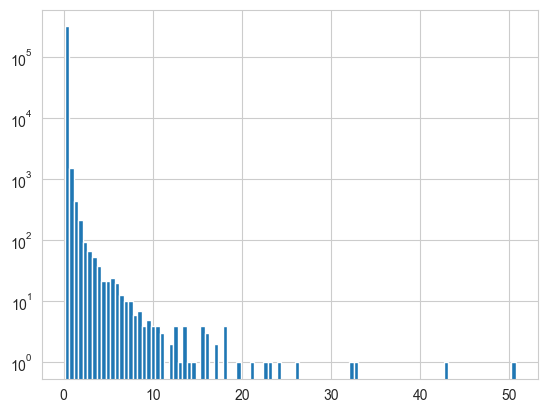

In [80]:
plt.hist(subtract, bins = 100)
plt.yscale("log")
plt.show()

In [79]:
subtract[subtract > 10]

10570     10.370961
14456     16.135864
23809     17.976717
24129     22.617869
34813     14.116310
45923     11.006929
53093     18.002484
55923     20.965534
58383     15.398650
71279     13.165317
87853     13.682281
89778     14.450092
96854     10.363865
100437    17.098579
104013    19.781822
125649    10.433320
133857    10.021686
136530    12.173157
139053    10.137965
140377    32.588747
146591    12.587182
151924    42.879854
159202    23.957389
167362    12.395600
168033    18.322273
182078    50.714194
184620    15.972642
187764    15.386758
206257    10.920949
209894    12.623092
223755    13.445311
227422    10.316866
232692    32.413173
233845    13.547718
240300    18.101048
243547    15.758069
257085    15.474582
284445    26.314718
286556    17.334490
289431    10.029994
294305    12.222919
294431    11.211947
308316    16.046932
308422    22.964352
310190    12.773567
317377    13.354112
dtype: float64

In [76]:
ev_dev.query("Event == 11")

,Event,E
333,11,77.6251


In [77]:
ev_ip.query("Event == 11")

,Event,E_mu
11,11,77.439197


In [5]:


# Sample data (same as above)
data = df_1_geant4.query("label == 'numu' & IP < 0.1")['IP']

# Compute the KDE using scipy
kde = gaussian_kde(data)

# Generate values for the x-axis
x_values = np.linspace(data.min(), data.max(), 1000)

# Evaluate the PDF at those x-values
pdf_values = kde(x_values)
# Plot the estimated PDF

#plt.show()

# Assuming you have the DataFrame with the PDF values
pdf_df = pd.DataFrame({"pdf": pdf_values, "x_val": x_values})
pdf_df_1 = pdf_df.loc[pdf_df["x_val"] < 0.1]
plt.plot(pdf_df_1["x_val"], pdf_df_1["pdf"])
plt.title("Estimated PDF using KDE")
plt.xlabel("Ekin_in")
plt.ylabel("Density")
# Find the row with the maximum PDF value
mpv_row = pdf_df.loc[pdf_df['pdf'].idxmax()]

# Extract the MPV (x_val where pdf is highest)
mpv = mpv_row['x_val']

print(f"The Most Probable Value (MPV) is: {mpv}")

mode = stats.mode(data)



NameError: name 'df_1_geant4' is not defined

<Axes: xlabel='Pt_miss', ylabel='Count'>

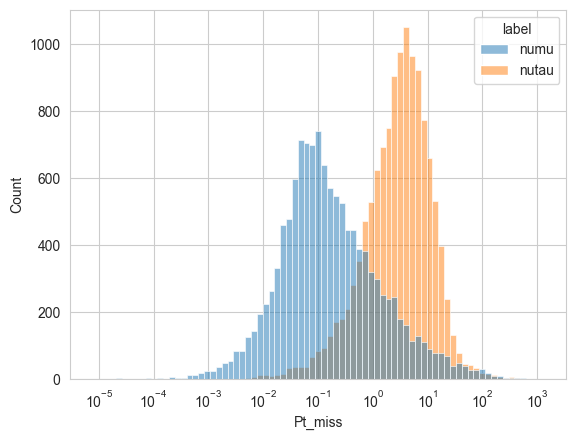

In [473]:
sns.histplot(x = df_1_geant4["Pt_miss"]**2, hue = df_1_geant4["label"], log_scale=True)

<Axes: xlabel='IP', ylabel='Count'>

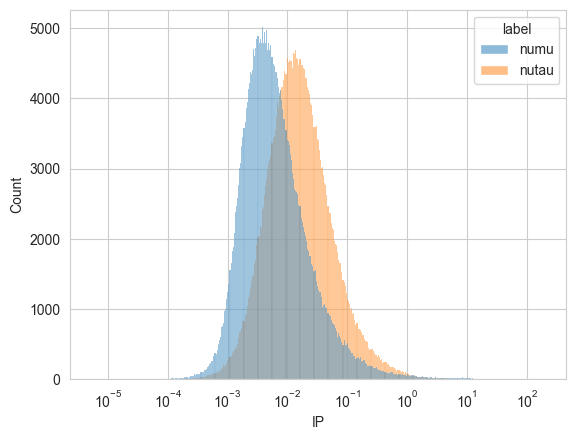

In [84]:
sns.histplot(x = df_1_geant4["IP"], hue = df_1_geant4["label"], log_scale=True)

numu: 0.4846737241270343, nutau: 0.7508489299534076


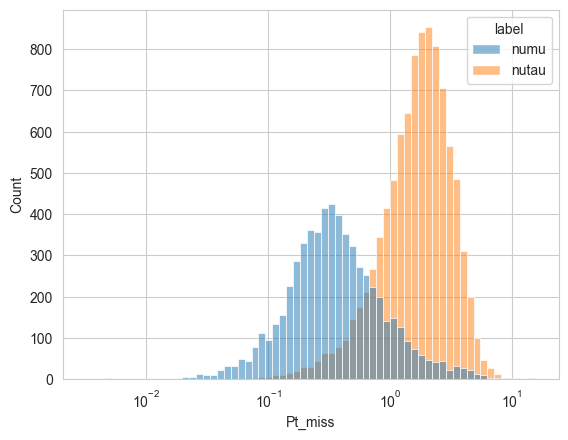

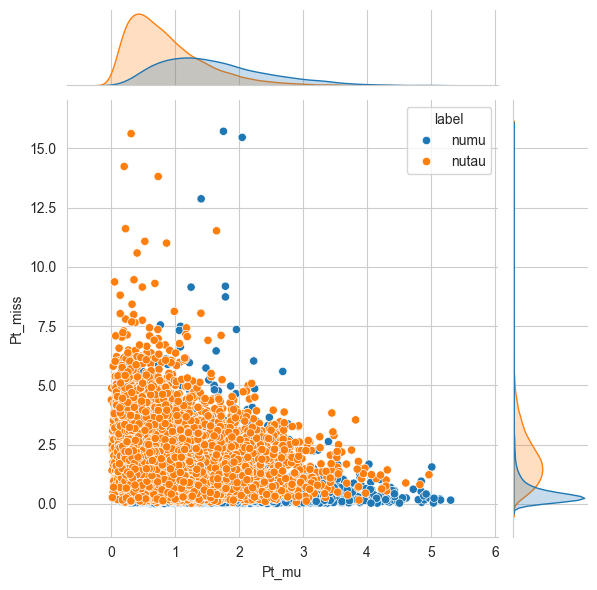

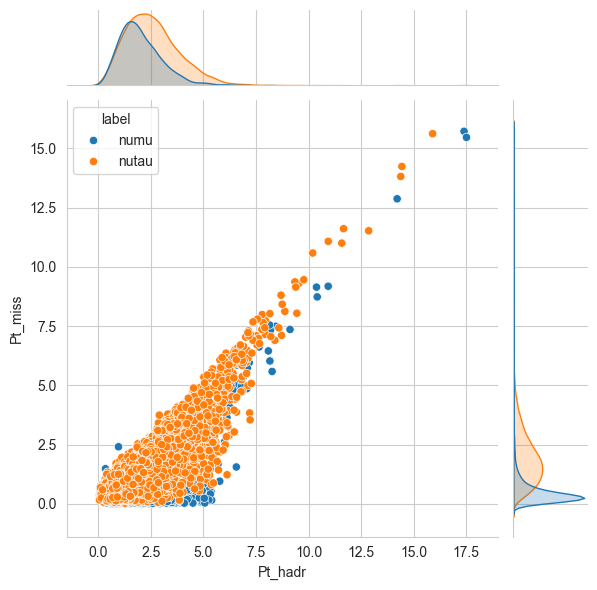

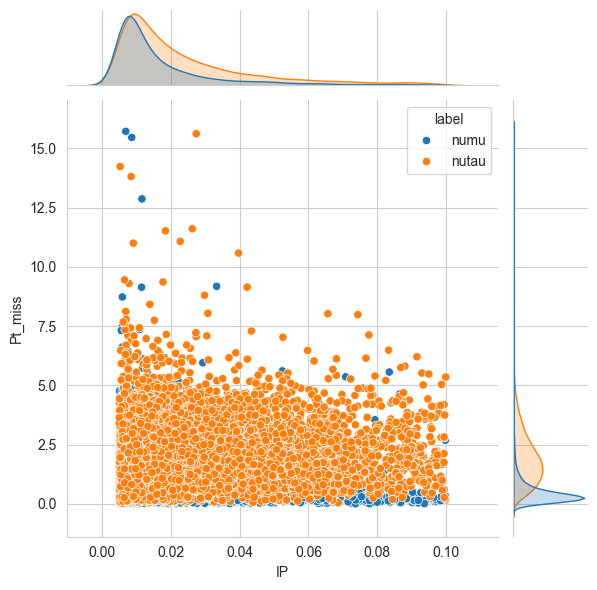

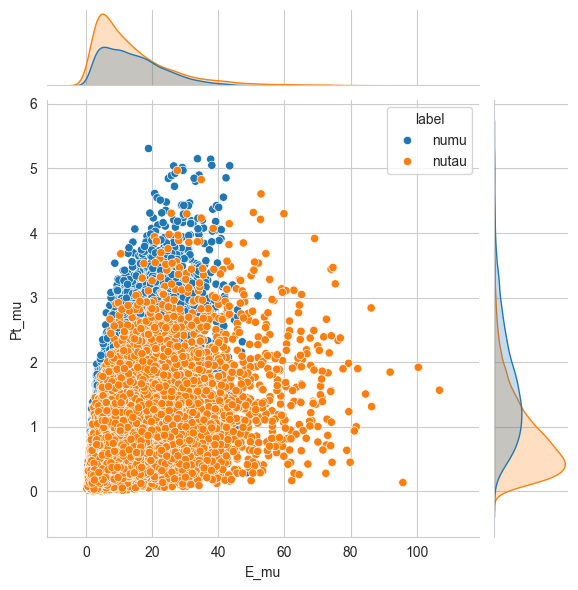

In [30]:
neutrals = [
            #"neutron", "antineutron", "proton", "antiproton", 
            'nu_e_bar', 'nu_e', 'nu_mu_bar', 'nu_mu', 'nu_tau', 'nu_tau_bar', 
            ]
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, p_cut = 0.25, ideal = False, planes = "")
construct_params(df_1_geant4)
# Update the 'weight' column based on the 'label'
df_1_geant4.loc[df_1_geant4['label'] == 'numu', 'weight'] = 300.0  # Set weight to 300 for 'numu'
df_1_geant4.loc[df_1_geant4['label'] == 'nutau', 'weight'] = 1.0   

df_vis = df_1_geant4.loc[(df_1_geant4["IP"] > .005) & (df_1_geant4["IP"] < .1)]
#df_vis = df_1_geant4
#df_vis = pd.concat([df_1_geant4.loc[df_1_geant4['label'] == 'numu'], df_1_geant4.loc[df_1_geant4['label'] == 'nutau'].sample(len(df_1_geant4.query("label == 'nutau'"))//300)])
#df_vis = df_vis.loc[(df_vis["IP"] > .005) & (df_vis["IP"] < .1)]
numu_num = len(df_vis.query("label == 'numu'"))/len(df_1_geant4.query("label == 'numu'"))
nutau_num = len(df_vis.query("label == 'nutau'"))/len(df_1_geant4.query("label == 'nutau'"))
print(f"numu: {numu_num}, nutau: {nutau_num}")
df_vis["Pt_miss/Pt_mu"] = df_vis["Pt_miss"]/df_vis["Pt_mu"]
sns.histplot(x = df_vis["Pt_miss"], hue = df_vis["label"], log_scale=True)
#sns.histplot(x = df_vis["E_hadr"], hue = df_vis["label"], log_scale=True)
#sns.histplot(x = df_vis["IP"], hue = df_vis["label"], log_scale=True)
plot_density(df_vis, label = 'label', params = ["Pt_mu", "Pt_miss"])
plot_density(df_vis, label = 'label', params = ["Pt_hadr", "Pt_miss"])
plot_density(df_vis, label = 'label', params = ["IP", "Pt_miss"])
plot_density(df_vis, label = 'label', params = ["E_mu", "Pt_mu"])

<Axes: xlabel='E_mu', ylabel='Count'>

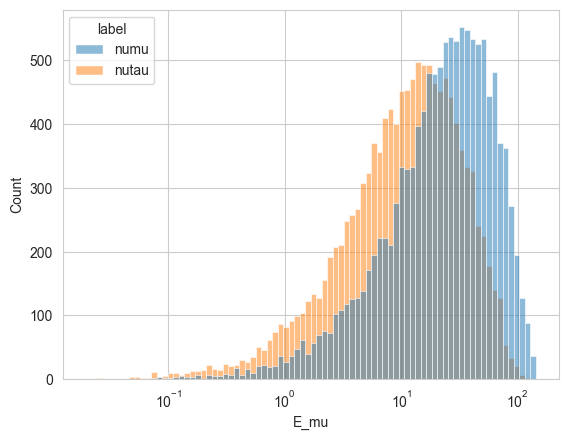

In [589]:
sns.histplot(x = df_vis["E_mu"], hue = df_vis["label"], log_scale=True)

Text(0, 0.5, 'Cumulative Explained Variance')

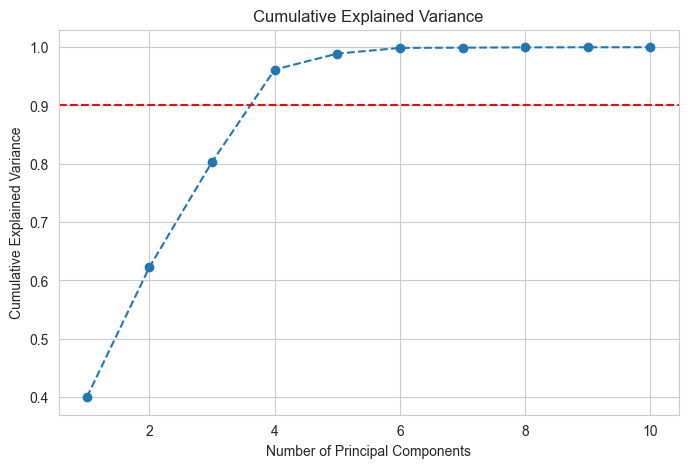

In [720]:
from sklearn.decomposition import PCA
pca_model = PCA(n_components=10, random_state=42)
X = df_vis.drop(columns = ['Event','Pt_mu_old', 'P_mu_old', 'Pt_hadr_old', 'P_hadr_old', 'label', 'weight', "IP"])
y = df_vis["label"].map({"numu": 0, "nutau": 1})
weights = df_vis["weight"]
pca_model_output = pca_model.fit_transform(X)
explained_variance = pca_model.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.axhline(y=0.9, color='r', linestyle='--')  # Horizontal line at 90% explained variance
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')

In [243]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay


def train_and_get_results(X, y, weights):
    # Sample Data (Replace with your own dataset)
    # Assume X is your feature matrix and y is the target variable (0/1 classification)
    # For demonstration, let's create a random dataset
    feature_names = X.columns
    
    # Split the data
    X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(X, y, weights, test_size=0.2, random_state=42)
    
    # Define parameters for LightGBM
    params = {
        'objective': 'binary',   # For binary classification
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'learning_rate': 0.1,
        'num_leaves': 100,
        'verbose': -1
    }
    
    #model = lgb.LGBMClassifier(**params)

    model = lgb.LGBMClassifier(boosting_type = "gbdt", objective='binary', metric='binary_logloss', 
                            max_depth=-1, 
                            n_estimators=1, 
                            num_leaves = 31,
                            min_child_samples = 60,
                            min_split_gain = 4,
                            reg_lambda = 5.0,
                            verbose = -1
                            )
    #model = DecisionTreeClassifier(max_depth=-1, num_leaves = 31)
    model.fit(
        X_train, y_train,
        sample_weight=w_train,  
    )
    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_class = np.round(y_pred)  # Round predictions to 0 or 1
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred_class)
    print(f"Accuracy: {accuracy:.4f}")
    
    # Plot feature importance
    lgb.plot_importance(model, max_num_features=10, importance_type='split')
    plt.title("Feature Importance by Split Count")
    plt.show()
    
    # Alternatively, plot by 'gain' (total gain of splits)
    lgb.plot_importance(model, max_num_features=10, importance_type='gain')
    plt.title("Feature Importance by Gain")
    plt.show()
    
    
    # Generate confusion matrix
    cm = confusion_matrix(y_test, y_pred, 
                          sample_weight = w_test
                         )
    
    # Plot confusion matrix using seaborn
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, cmap="Blues", xticklabels=[0, 1], yticklabels=[0, 1])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()
    
    pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Plot histogram of predicted probabilities
    plt.figure(figsize=(12, 8), dpi=100)
    plt.hist(pred_proba[y_test == 1], bins=50, alpha=1.0, histtype = "step", label='nutau', 
             weights=w_test[y_test == 1]
            )
    plt.hist(pred_proba[y_test == 0], bins=50, alpha=1.0, histtype = "step", label='numu', 
             weights=w_test[y_test == 0]
            )
    plt.yscale("log")
    plt.xlabel('Predicted Probability')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Probabilities')
    plt.legend(loc='upper right')


In [528]:
y

0        0
2        0
3        0
4        0
5        0
        ..
12661    1
12662    1
12663    1
12664    1
12665    1
Name: label, Length: 15651, dtype: int64

In [527]:
weights

0          1.000000
2          1.000000
3          1.000000
4          1.000000
5          1.000000
            ...    
12661    303.459225
12662    303.459225
12663    303.459225
12664    303.459225
12665    303.459225
Name: weight, Length: 15651, dtype: float64

numu: 1.0, nutau: 1.0


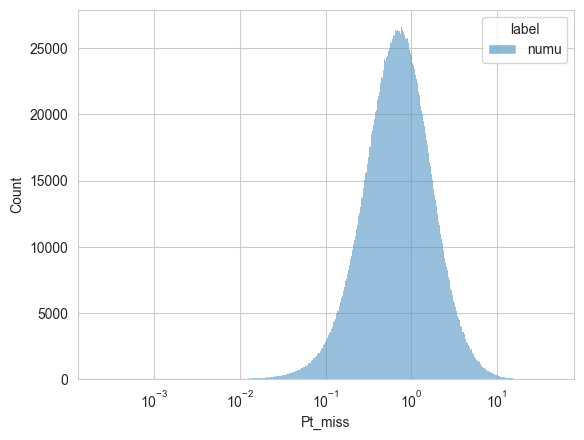

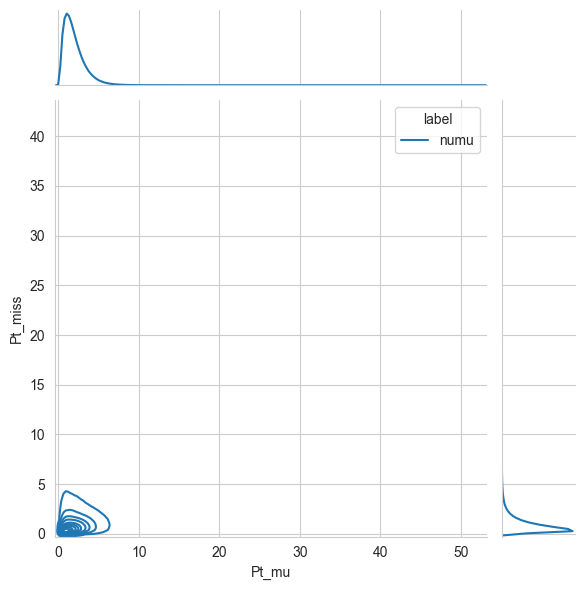

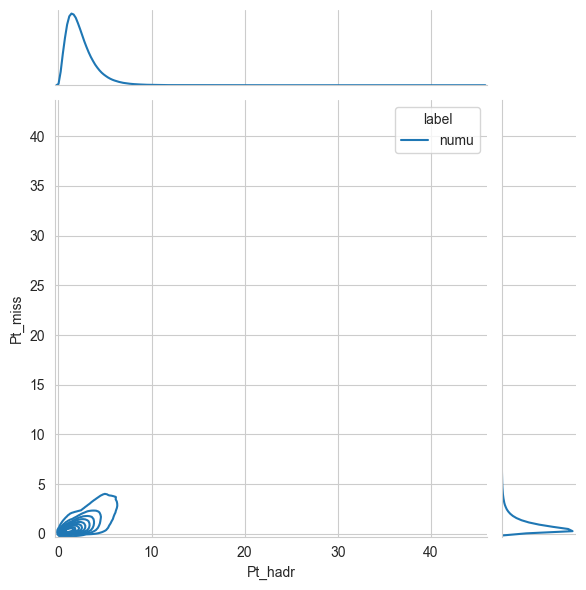

ValueError: Could not interpret value `IP` for `x`. An entry with this name does not appear in `data`.

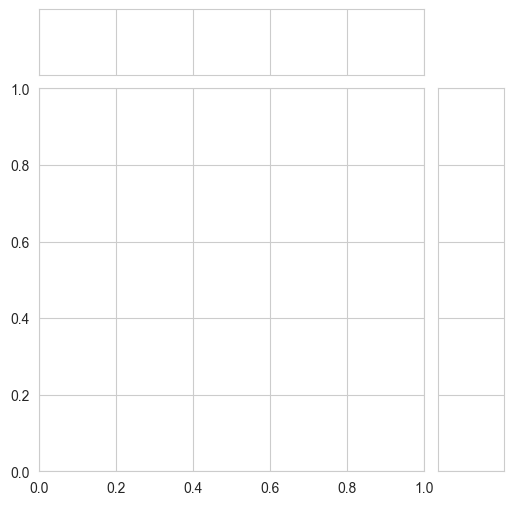

In [73]:
neutrals = [
            #"neutron", "antineutron", "proton", "antiproton", 
            'nu_e_bar', 'nu_e', 'nu_mu_bar', 'nu_mu', 'nu_tau', 'nu_tau_bar', 
            ]
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = True, planes = "", IP=True)
construct_params(df_1_geant4)
# Update the 'weight' column based on the 'label'
df_1_geant4.loc[df_1_geant4['label'] == 'numu', 'weight'] = 300.0  # Set weight to 300 for 'numu'
df_1_geant4.loc[df_1_geant4['label'] == 'nutau', 'weight'] = 1.0   

#df_vis_ideal = df_1_geant4.loc[(df_1_geant4["IP"] > .005) & (df_1_geant4["IP"] < .1)]
df_vis = df_1_geant4
numu_num = len(df_vis.query("label == 'numu'"))/len(df_1_geant4.query("label == 'numu'"))
nutau_num = len(df_vis.query("label == 'nutau'"))/len(df_1_geant4.query("label == 'nutau'"))
print(f"numu: {numu_num}, nutau: {nutau_num}")
df_vis["Pt_miss/Pt_mu"] = df_vis["Pt_miss"]/df_vis["Pt_mu"]
sns.histplot(x = df_vis_ideal["Pt_miss"], hue = df_vis_ideal["label"], log_scale=True)
#sns.histplot(x = df_vis["IP"], hue = df_vis["label"], log_scale=True)
plot_density(df_vis_ideal, label = 'label', params = ["Pt_mu", "Pt_miss"])
plot_density(df_vis_ideal, label = 'label', params = ["Pt_hadr", "Pt_miss"])
plot_density(df_vis_ideal, label = 'label', params = ["IP", "Pt_miss"])
plot_density(df_vis_ideal, label = 'label', params = ["E_mu", "Pt_mu"])

In [646]:
string_hadrs = df_vis.merge(df_vis_ideal[["Event", "E_hadr", "Pt_hadr", "px_hadr", "py_hadr"]], on = "Event", suffixes=("_string", "_"))
# plot_density(, label = 'label', params = ["E_mu", "Pt_mu"])
string_hadrs

,Event,px_mu,py_mu,pz_mu,E_mu,IP,weight,px_hadr_string,py_hadr_string,pz_hadr,...,P_hadr_old,anglePtmissandPtmuon,anglePtmissandPthadr,anglePtmuonandPthadr,anglePhadrandPmuon,Pt_miss/Pt_mu,E_hadr_,Pt_hadr_,px_hadr_,py_hadr_
0,0,-2.952162,-1.295885,32.178738,32.339856,0.005410,300.0,3.387249,1.620898,51.497108,...,51.633835,166.939630,11.187505,1.872865,9.890759,0.168445,48.79440,3.517987,3.206247,1.447830
1,0,-2.952162,-1.295885,32.178738,32.339856,0.005410,300.0,3.387249,1.620898,51.497108,...,51.633835,166.939630,11.187505,1.872865,9.890759,0.168445,54.30350,3.065574,-0.939274,-2.918135
2,2,-0.423303,-0.195891,19.471686,19.477304,0.008799,300.0,0.341805,0.346351,36.829190,...,36.832405,86.390764,73.064054,20.545182,2.097942,0.366855,36.83240,0.486611,0.341805,0.346352
3,3,-1.856559,-3.245440,29.447076,29.683517,0.005923,300.0,1.885609,4.123633,40.131650,...,40.386993,152.122833,22.678527,5.198639,13.668381,0.235006,31.97700,3.749509,1.816493,3.280117
4,3,-1.856559,-3.245440,29.447076,29.683517,0.005923,300.0,1.885609,4.123633,40.131650,...,40.386993,152.122833,22.678527,5.198639,13.668381,0.235006,8.43083,0.592668,0.215814,-0.551978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23545,12772,-0.286242,0.008719,14.549475,14.552340,0.023901,1.0,2.328856,-2.500032,13.608725,...,14.031077,131.092925,3.621671,45.285404,14.908161,11.249652,39.68840,3.291945,3.109544,-1.080573
23546,12772,-0.286242,0.008719,14.549475,14.552340,0.023901,1.0,2.328856,-2.500032,13.608725,...,14.031077,131.092925,3.621671,45.285404,14.908161,11.249652,14.03110,3.416687,2.328862,-2.500030
23547,12773,0.325798,0.439505,24.387621,24.393790,0.013052,1.0,-1.364573,-8.127115,12.116008,...,14.652976,151.146460,1.835885,27.017655,35.371233,14.179475,68.92060,0.691113,-0.690192,-0.035660
23548,12773,0.325798,0.439505,24.387621,24.393790,0.013052,1.0,-1.364573,-8.127115,12.116008,...,14.652976,151.146460,1.835885,27.017655,35.371233,14.179475,4.41008,2.480240,-0.410692,-2.446001


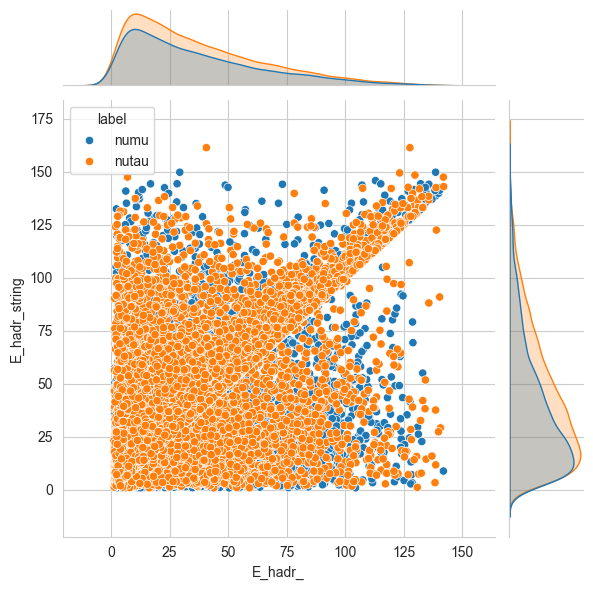

In [647]:
plot_density(string_hadrs, label = 'label', params = ["E_hadr_", "E_hadr_string"])

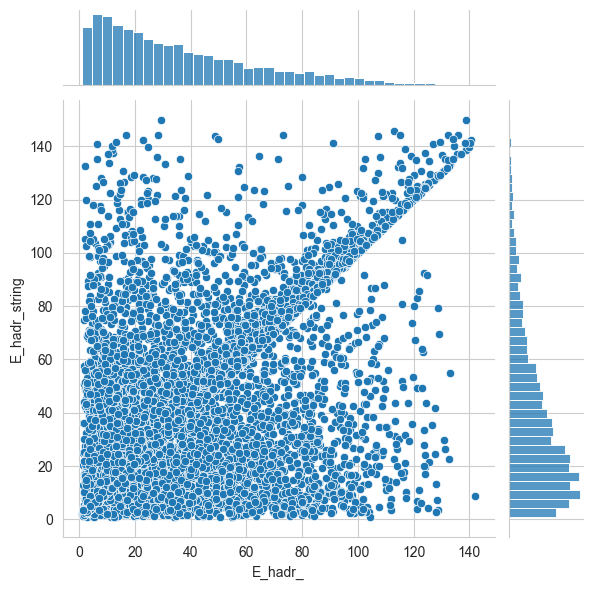

In [648]:
sns.jointplot(string_hadrs.query("label == 'numu'"), x = "E_hadr_", y = "E_hadr_string")

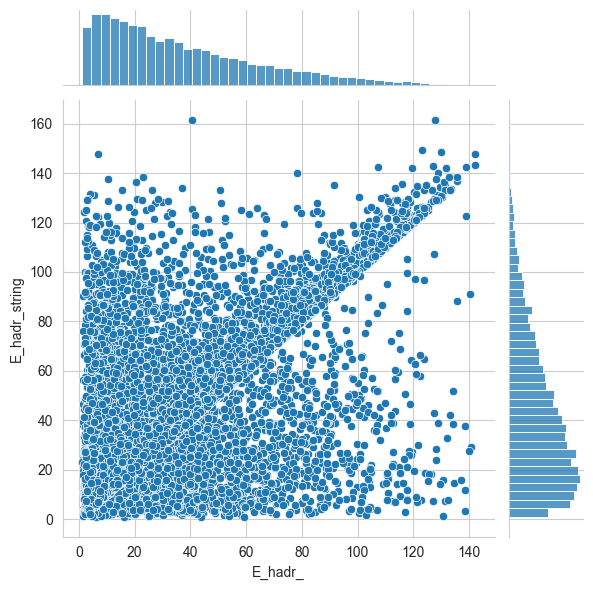

In [649]:
sns.jointplot(string_hadrs.query("label == 'nutau'"), x = "E_hadr_", y = "E_hadr_string")

In [650]:
string_hadrs.query("label == 'nutau' & E_hadr_ > E_hadr_string")[["Event", "E_hadr_", "E_hadr_string"]]

,Event,E_hadr_,E_hadr_string
10140,3,31.9770,15.842617
10143,4,60.0467,60.046652
10146,7,34.1254,34.125380
10147,9,43.2685,43.268453
10158,21,109.0870,109.086880
...,...,...,...
23534,12765,42.6061,25.851284
23537,12766,67.6717,67.671684
23545,12772,39.6884,14.031077
23546,12772,14.0311,14.031077


In [651]:
df_geant4["tau"].query("Event == 3")

,Event,Number,id,m_id,name,px,py,pz,E,final,Xin,Yin,Zin,weight,label
106,3,0,16,-1,nu_tau,0.000000,0.000000,73.762500,73.762500,0,2.93521,0.882388,-0.380270,1.0,nutau
107,3,1,1000260560,-1,Fe56,0.000000,0.000000,0.000000,52.089800,0,0.00000,0.000000,0.000000,1.0,nutau
108,3,2,2212,1,proton,-0.170120,0.088902,0.145612,0.927521,0,2.93521,0.882388,-0.380270,1.0,nutau
109,3,3,1000250550,1,Mn55,0.170120,-0.088902,-0.145612,51.162300,0,0.00000,0.000000,0.000000,1.0,nutau
110,3,4,15,0,tau-,-0.367110,0.592734,66.231600,66.259100,1,2.93521,0.882388,-0.380270,1.0,nutau
111,3,5,2000000001,2,HadrSyst,0.196990,-0.503832,7.676420,8.430830,0,0.00000,0.000000,0.000000,1.0,nutau
112,3,6,2,5,u,0.195855,-0.500929,7.632180,7.658230,0,2.93521,0.882388,-0.380270,1.0,nutau
113,3,7,2203,5,uu_1,0.001135,-0.002903,0.044235,0.772604,0,2.93521,0.882388,-0.380270,1.0,nutau
114,3,8,92,6,string,0.196990,-0.503832,7.676420,8.430830,0,2.93521,0.882388,-0.380270,1.0,nutau
115,3,9,211,8,pi+,0.281193,-0.374333,5.424220,5.446170,0,3.76886,-0.227387,15.700800,1.0,nutau


In [641]:
df_geant4["tau"].query("Event == 7 & final == 1 & id != 15")["E"].sum()

34.12538

In [658]:
df_geant4["tau"].query("id == 92")

,Event,Number,id,m_id,name,px,py,pz,E,final,Xin,Yin,Zin,weight,label
8,0,8,92,6,string,-0.923732,-2.869850,53.31980,54.30350,0,0.893001,-0.689810,-1.184970,1.0,nutau
34,1,8,92,6,string,-3.795200,-0.395716,39.99820,40.52570,0,-1.934270,0.148805,4.475500,1.0,nutau
65,2,8,92,6,string,-3.903110,-0.664236,46.72070,47.35280,0,-1.331000,1.563920,-3.388180,1.0,nutau
114,3,8,92,6,string,0.196990,-0.503832,7.67642,8.43083,0,2.935210,0.882388,-0.380270,1.0,nutau
138,4,8,92,6,string,0.448372,2.254700,59.44230,60.04670,0,-4.019520,-1.933960,0.607383,1.0,nutau
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3049115,99995,8,92,6,string,-0.315949,-2.687930,14.00970,15.20850,0,-1.788300,-1.679820,3.559180,1.0,nutau
3049139,99996,8,92,6,string,-0.935874,2.567220,12.42530,13.24050,0,-5.016760,-2.304850,0.648462,1.0,nutau
3049163,99997,8,92,6,string,-0.687456,0.457823,34.77010,35.39450,0,2.598710,0.033572,-3.409260,1.0,nutau
3049206,99998,8,92,6,string,0.504225,-1.186540,5.60364,6.61152,0,-2.247850,-4.405970,0.767758,1.0,nutau


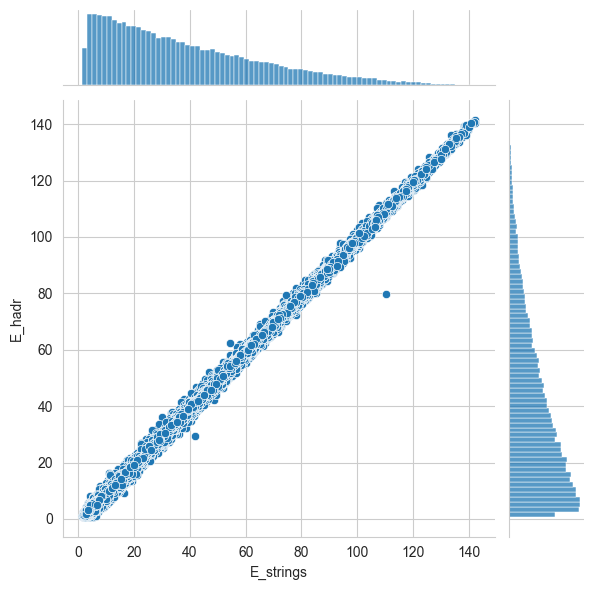

In [163]:
sns.jointplot(extract_string(df_geant4["tau"]).merge(extract_showers(df_geant4["tau"], cut_on_p=0.75), on = "Event", suffixes = ("_strings", "_hadr")), 
              x = "E_strings", y = "E_hadr")

In [676]:
extract_string(df_geant4["tau"]).merge(extract_showers(df_geant4["tau"]), on = "Event")

,Event,px_x,py_x,pz_x,E_x,px_y,py_y,pz_y,E_y
0,0,-0.923732,-2.869850,53.31980,54.30350,-1.112332,-2.925176,53.422655,55.243955
1,1,-3.795200,-0.395716,39.99820,40.52570,-3.795196,-0.395716,39.998186,40.525714
2,2,-3.903110,-0.664236,46.72070,47.35280,-4.086240,-0.637024,46.906167,53.067923
3,3,0.196990,-0.503832,7.67642,8.43083,0.196989,-0.503833,7.676421,15.842617
4,4,0.448372,2.254700,59.44230,60.04670,0.448374,2.254704,59.442350,60.046652
...,...,...,...,...,...,...,...,...,...
95815,99995,-0.315949,-2.687930,14.00970,15.20850,-0.315949,-2.687931,14.009657,15.208530
95816,99996,-0.935874,2.567220,12.42530,13.24050,-0.935875,2.567227,12.425265,13.240490
95817,99997,-0.687456,0.457823,34.77010,35.39450,-0.866766,0.438983,34.567170,39.199808
95818,99998,0.504225,-1.186540,5.60364,6.61152,0.504225,-1.186540,5.603640,6.611513


In [679]:
df_geant4_ev = df_geant4["tau"].query("Event == 3")
df_geant4_ev

,Event,Number,id,m_id,name,px,py,pz,E,final,Xin,Yin,Zin,weight,label
106,3,0,16,-1,nu_tau,0.000000,0.000000,73.762500,73.762500,0,2.93521,0.882388,-0.380270,1.0,nutau
107,3,1,1000260560,-1,Fe56,0.000000,0.000000,0.000000,52.089800,0,0.00000,0.000000,0.000000,1.0,nutau
108,3,2,2212,1,proton,-0.170120,0.088902,0.145612,0.927521,0,2.93521,0.882388,-0.380270,1.0,nutau
109,3,3,1000250550,1,Mn55,0.170120,-0.088902,-0.145612,51.162300,0,0.00000,0.000000,0.000000,1.0,nutau
110,3,4,15,0,tau-,-0.367110,0.592734,66.231600,66.259100,1,2.93521,0.882388,-0.380270,1.0,nutau
111,3,5,2000000001,2,HadrSyst,0.196990,-0.503832,7.676420,8.430830,0,0.00000,0.000000,0.000000,1.0,nutau
112,3,6,2,5,u,0.195855,-0.500929,7.632180,7.658230,0,2.93521,0.882388,-0.380270,1.0,nutau
113,3,7,2203,5,uu_1,0.001135,-0.002903,0.044235,0.772604,0,2.93521,0.882388,-0.380270,1.0,nutau
114,3,8,92,6,string,0.196990,-0.503832,7.676420,8.430830,0,2.93521,0.882388,-0.380270,1.0,nutau
115,3,9,211,8,pi+,0.281193,-0.374333,5.424220,5.446170,0,3.76886,-0.227387,15.700800,1.0,nutau


In [697]:
df_geant4_ev["p"] = np.sqrt(df_geant4_ev["px"]**2 + df_geant4_ev["py"]**2 + df_geant4_ev["pz"]**2)
# df_geant4_ev["sigma/m"] = (df_geant4_ev["E"] - df_geant4_ev["p"])/ 
df_geant4_ev.query("p > 0.5").query("final == 1 & id != 15")

,Event,Number,id,m_id,name,px,py,pz,E,final,Xin,Yin,Zin,weight,label,p
118,3,12,211,9,pi+,0.281193,-0.374333,5.424220,5.44617,1,3.76886,-0.227387,15.700800,1.0,nutau,5.444388
119,3,13,2112,10,neutron,0.406446,-0.272423,2.212960,2.45345,1,5.76836,-1.016540,15.045200,1.0,nutau,2.266408
122,3,16,2212,14,proton,0.190189,0.526210,-0.098464,1.09687,1,1.20644,1.385970,-0.242007,1.0,nutau,0.568123


In [ ]:
df_geant4["tau"].loc[df_geant4["tau"]["name"] == "HadrClus"]["Number"]

<Axes: >

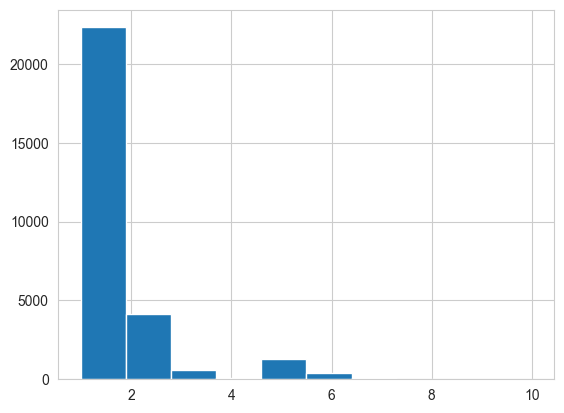

In [703]:
df_geant4["tau"].query("name == 'HadrClus'").groupby("Event").count()["E"].hist()

In [674]:
extract_string(df_geant4["tau"])

,Event,px,py,pz,E
5,0,-0.923732,-2.869850,53.31980,54.30350
31,1,-3.795200,-0.395716,39.99820,40.52570
62,2,-3.903110,-0.664236,46.72070,47.35280
111,3,0.196990,-0.503832,7.67642,8.43083
135,4,0.448372,2.254700,59.44230,60.04670
...,...,...,...,...,...
3049112,99995,-0.315949,-2.687930,14.00970,15.20850
3049136,99996,-0.935874,2.567220,12.42530,13.24050
3049160,99997,-0.687456,0.457823,34.77010,35.39450
3049203,99998,0.504225,-1.186540,5.60364,6.61152


In [677]:
extract_string(df_geant4["tau"]).merge(extract_showers(df_geant4["tau"]), on = "Event")

,Event,px_x,py_x,pz_x,E_x,px_y,py_y,pz_y,E_y
0,0,-0.923732,-2.869850,53.31980,54.30350,-1.112332,-2.925176,53.422655,55.243955
1,1,-3.795200,-0.395716,39.99820,40.52570,-3.795196,-0.395716,39.998186,40.525714
2,2,-3.903110,-0.664236,46.72070,47.35280,-4.086240,-0.637024,46.906167,53.067923
3,3,0.196990,-0.503832,7.67642,8.43083,0.196989,-0.503833,7.676421,15.842617
4,4,0.448372,2.254700,59.44230,60.04670,0.448374,2.254704,59.442350,60.046652
...,...,...,...,...,...,...,...,...,...
95815,99995,-0.315949,-2.687930,14.00970,15.20850,-0.315949,-2.687931,14.009657,15.208530
95816,99996,-0.935874,2.567220,12.42530,13.24050,-0.935875,2.567227,12.425265,13.240490
95817,99997,-0.687456,0.457823,34.77010,35.39450,-0.866766,0.438983,34.567170,39.199808
95818,99998,0.504225,-1.186540,5.60364,6.61152,0.504225,-1.186540,5.603640,6.611513


In [690]:
extract_showers(df_geant4["tau"])

,Event,px,py,pz,E
0,0,-1.112332,-2.925176,53.422655,55.243955
1,1,-3.795196,-0.395716,39.998186,40.525714
2,2,-4.086240,-0.637024,46.906167,53.067923
3,3,0.196989,-0.503833,7.676421,15.842617
4,4,0.448374,2.254704,59.442350,60.046652
...,...,...,...,...,...
99889,99995,-0.315949,-2.687931,14.009657,15.208530
99890,99996,-0.935875,2.567227,12.425265,13.240490
99891,99997,-0.866766,0.438983,34.567170,39.199808
99892,99998,0.504225,-1.186540,5.603640,6.611513


In [704]:
df_geant4["tau"].query("Event == 1 ")

,Event,Number,id,m_id,name,px,py,pz,E,final,Xin,Yin,Zin,weight,label
26,1,0,16,-1,nu_tau,0.000000,0.000000,73.694900,73.694900,0,-1.934270,0.148805,4.4755,1.0,nutau
27,1,1,1000260560,-1,Fe56,0.000000,0.000000,0.000000,52.089800,0,0.000000,0.000000,0.0000,1.0,nutau
28,1,2,2112,1,neutron,-0.050678,0.108405,0.143898,0.928026,0,-1.934270,0.148805,4.4755,1.0,nutau
29,1,3,1000260550,1,Fe55,0.050678,-0.108405,-0.143898,51.161800,0,0.000000,0.000000,0.0000,1.0,nutau
30,1,4,15,0,tau-,3.744520,0.504121,33.840600,34.097200,1,-1.934270,0.148805,4.4755,1.0,nutau
31,1,5,2000000001,2,HadrSyst,-3.795200,-0.395716,39.998200,40.525700,0,0.000000,0.000000,0.0000,1.0,nutau
32,1,6,2,5,u,-3.729920,-0.388910,39.310200,39.490100,0,-1.934270,0.148805,4.4755,1.0,nutau
33,1,7,2103,5,ud_1,-0.065278,-0.006806,0.687970,1.035650,0,-1.934270,0.148805,4.4755,1.0,nutau
34,1,8,92,6,string,-3.795200,-0.395716,39.998200,40.525700,0,-1.934270,0.148805,4.4755,1.0,nutau
35,1,9,223,8,omega,-1.500240,-0.290250,14.806600,14.905800,0,-1.934270,0.148805,4.4755,1.0,nutau


# Estimating Pt_miss differences

In [23]:
from scipy.stats import wasserstein_distance
# from scipy.stats import wasserstein_distance_nd


neutrals_list = [[
            #"neutron", "antineutron", "proton", "antiproton", 
            'nu_e_bar', 'nu_e', 'nu_mu_bar', 'nu_mu', 'nu_tau', 'nu_tau_bar', 
            ], []]
p_cut_list = [None, 0.25, 0.5, 0.75, 1.]
ideal_list = [False, True]
planes_list = ["_2345planes", ""]

stat_df = []
for ideal in ideal_list: 
    for neutrals in neutrals_list:
        for p_cut in p_cut_list:
            for planes in planes_list:
                df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, p_cut = p_cut, ideal = ideal, planes = planes)
                construct_params(df_1_geant4)
                out_stats = df_1_geant4.drop(columns = ['Event','Pt_mu_old', 'P_mu_old', 'Pt_hadr_old', 'P_hadr_old', 'weight', "IP"])
                out_stats_mu = out_stats.query("label == 'numu'").drop(columns = ["label"])["Pt_miss"]
                out_stats_tau = out_stats.query("label == 'nutau'").drop(columns = ["label"])["Pt_miss"]
                dist = wasserstein_distance(out_stats_mu.values, out_stats_tau.values)
                out_stats_mu_Ehadr = out_stats.query("label == 'numu'").drop(columns = ["label"])["E_hadr"]
                out_stats_tau_Ehadr = out_stats.query("label == 'nutau'").drop(columns = ["label"])["E_hadr"]
                dist_Ehadr = wasserstein_distance(out_stats_mu_Ehadr.values, out_stats_tau_Ehadr.values)
                stat_df.append([dist, dist_Ehadr, ideal, neutrals, p_cut, planes])
                #print(f"Wasserstein Distance: {dist}. ideal : {ideal}, neutrals: {neutrals}, p_cut: {p_cut}, planes: {planes}")
stat_df = pd.DataFrame(stat_df)
stat_df.columns = ["dist_ptmiss", "dist_E_hadr", "ideal", "neutrals", "p_cut", "planes"]

In [25]:
stat_df.sort_values(by = ["dist_E_hadr"])

,dist_ptmiss,dist_E_hadr,ideal,neutrals,p_cut,planes
8,1.085672,6.478541,False,"[nu_e_bar, nu_e, nu_mu_bar, nu_mu, nu_tau, nu_...",1.00,_2345planes
18,1.090424,6.494439,False,[],1.00,_2345planes
9,1.106323,6.514752,False,"[nu_e_bar, nu_e, nu_mu_bar, nu_mu, nu_tau, nu_...",1.00,
19,1.111137,6.530631,False,[],1.00,
0,1.264516,6.567867,False,"[nu_e_bar, nu_e, nu_mu_bar, nu_mu, nu_tau, nu_...",NaN,_2345planes
22,1.372360,6.573068,True,"[nu_e_bar, nu_e, nu_mu_bar, nu_mu, nu_tau, nu_...",0.25,_2345planes
20,1.372360,6.573068,True,"[nu_e_bar, nu_e, nu_mu_bar, nu_mu, nu_tau, nu_...",NaN,_2345planes
38,1.372360,6.573068,True,[],1.00,_2345planes
28,1.372360,6.573068,True,"[nu_e_bar, nu_e, nu_mu_bar, nu_mu, nu_tau, nu_...",1.00,_2345planes
30,1.372360,6.573068,True,[],NaN,_2345planes


In [728]:
df_1_geant4

,Event,px_mu,py_mu,pz_mu,E_mu,IP,weight,px_hadr,py_hadr,pz_hadr,...,Pt_hadr,Pt_mu,Pt_mu_old,P_mu_old,Pt_hadr_old,P_hadr_old,anglePtmissandPtmuon,anglePtmissandPthadr,anglePtmuonandPthadr,anglePhadrandPmuon
0,0,-2.911164,-1.254266,32.085745,32.241953,0.027522,1.000000,3.387249,1.620898,51.497108,...,3.755098,3.169868,3.169867,32.241946,3.755098,51.633835,165.708825,12.027332,2.263843,9.810821
1,1,-2.121542,0.141827,42.427162,42.480426,0.031308,1.000000,2.553111,-0.206240,29.522307,...,2.561428,2.126278,2.126278,42.480409,2.561428,29.633217,175.335679,3.870587,0.793734,7.827562
2,2,-0.344328,-0.190499,19.370644,19.374658,0.063697,1.000000,0.341805,0.346351,36.829190,...,0.486610,0.393512,0.393512,19.374641,0.486610,36.832405,118.026273,45.548858,16.424869,1.901969
3,3,-1.771950,-3.201142,29.319519,29.546961,0.045869,1.000000,1.885609,4.123633,40.131650,...,4.534300,3.658844,3.658841,29.546934,4.534300,40.386993,158.057805,17.549193,4.393002,13.549557
4,4,-1.504094,1.278205,6.777903,7.059556,0.087870,1.000000,2.234049,-1.829018,57.027907,...,2.887262,1.973881,1.973856,7.059468,2.887262,57.100950,176.679265,2.269519,1.051215,19.134511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12627,12775,0.413220,0.369220,9.697996,9.713898,0.149931,303.459225,-0.533701,-1.683759,0.827080,...,1.766319,0.554148,0.554143,9.713815,1.766319,1.950370,137.018159,12.350353,30.631488,67.733325
12628,12776,0.063863,-0.339863,17.267100,17.270635,0.085842,303.459225,0.634878,1.853069,7.889609,...,1.958809,0.345813,0.345811,17.270562,1.958809,8.129137,144.572001,5.873789,29.554210,14.951838
12629,12777,-2.081329,2.091252,42.559760,42.661915,0.015110,303.459225,2.749764,-2.893716,18.904759,...,3.991841,2.950469,2.950469,42.661908,3.991841,19.321612,174.929778,3.745305,1.324917,15.888069
12630,12778,-0.066113,-0.141962,5.117718,5.120158,0.225768,303.459225,-1.531504,2.029554,28.173952,...,2.542556,0.156603,0.156602,5.120113,2.542556,28.288446,114.784139,3.205608,62.010254,6.175783


# sampling and unrolling

In [413]:
neutrals = [
            #"neutron", "antineutron", "proton", "antiproton", 
            'nu_e_bar', 'nu_e', 'nu_mu_bar', 'nu_mu', 'nu_tau', 'nu_tau_bar', 
            ]
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = False, p_cut= 0.25, planes = "", IP = False)
df_1_geant4_mu = df_1_geant4.query("label == 'numu'")
# Unroll the data based on the weights

def unroll_sample(df_1_geant4, reduce_factor = 30):
    df_1_geant4_mu = df_1_geant4.query("label == 'numu'")
    df_unrolled = {}
    for col in df_1_geant4_mu.columns:
        unrolled_values = np.repeat(df_1_geant4_mu[col], reduce_factor)
        
        # Add Gaussian noise to each feature
        noise_std_feature = 0.05  # standard deviation for feature1 noise
        
        if col not in ["label","weight","Event"]:
            # Adding noise to each feature
            unrolled_values = np.random.normal(unrolled_values, noise_std_feature*np.abs(unrolled_values), size=len(unrolled_values))
    
        df_unrolled[col] = unrolled_values
    return pd.concat([pd.DataFrame(df_unrolled), df_1_geant4.query("label == 'nutau'")])

df_unrolled = unroll_sample(df_1_geant4)
df_unrolled

,Event,px_mu,py_mu,pz_mu,E_mu,weight,px_hadr,py_hadr,pz_hadr,E_hadr,label,Number,id,m_id,name,final,Xin,Yin,Zin
0,0,-2.883466,-1.334183,32.511990,33.501708,303.459225,3.291749,1.417551,49.216951,54.284067,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0,-3.104656,-1.354742,34.050465,35.957111,303.459225,3.053937,1.244923,48.409075,47.059061,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0,-3.365197,-1.378828,35.061700,31.834792,303.459225,3.065499,1.378215,44.004871,46.298074,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0,-3.035208,-1.328358,33.394160,31.838906,303.459225,2.991094,1.396481,46.010125,54.519350,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0,-3.321522,-1.368806,32.554455,31.338410,303.459225,3.265869,1.507293,51.265802,49.797940,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12736,12849,-0.156256,0.024503,1.212653,1.227480,1.000000,0.778333,-4.517553,50.758926,51.455210,nutau,4.0,13.0,0.0,muon,1.0,-1.070700,-4.149350,2.40076
12737,12850,-0.216347,-0.664799,5.930088,5.972091,1.000000,1.155082,0.809882,45.798929,52.146717,nutau,4.0,13.0,0.0,muon,1.0,0.237321,1.943340,-1.70360
12738,12851,0.210997,1.208451,30.136520,30.161663,1.000000,0.150029,-1.569852,27.241258,28.013419,nutau,4.0,13.0,0.0,muon,1.0,-1.346640,2.911330,1.47983
12739,12852,-0.010961,0.032730,2.012312,2.015380,1.000000,1.389607,-4.714516,34.740641,36.358198,nutau,4.0,13.0,0.0,muon,1.0,2.165830,0.556512,-2.11613


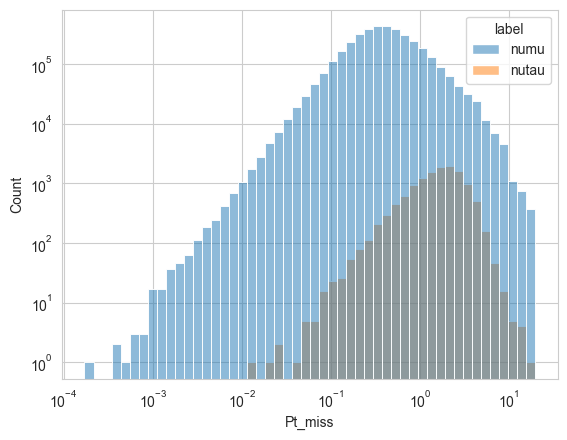

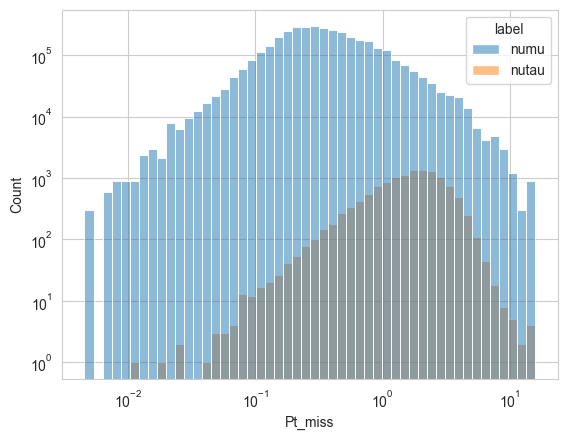

In [176]:
construct_params(df_unrolled)
construct_params(df_1_geant4)
# Update the 'weight' column based on the 'label'
df_unrolled.loc[df_unrolled['label'] == 'numu', 'weight'] = 300.0  # Set weight to 300 for 'numu'
df_unrolled.loc[df_unrolled['label'] == 'nutau', 'weight'] = 1.0   

df_1_geant4.loc[df_1_geant4['label'] == 'numu', 'weight'] = 300.0  # Set weight to 300 for 'numu'
df_1_geant4.loc[df_1_geant4['label'] == 'nutau', 'weight'] = 1.0  

#df_vis_ideal = df_unrolled.loc[(df_unrolled["IP"] > .005) & (df_unrolled["IP"] < .1)]
df_vis_ideal = df_unrolled
df_vis_ideal_1 = df_1_geant4
sns.histplot(x = df_vis_ideal["Pt_miss"], hue = df_vis_ideal["label"], log_scale=True, fill = True, bins=50)
plt.yscale('log')
plt.show()
sns.histplot(x = df_vis_ideal_1["Pt_miss"], hue = df_vis_ideal_1["label"], weights = df_vis_ideal_1["weight"], log_scale=True, fill = True, bins=50)
plt.yscale('log')
plt.show()
#sns.histplot(x = df_vis["IP"], hue = df_vis["label"], log_scale=True)
# plot_density(df_vis_ideal, label = 'label', params = ["Pt_mu", "Pt_miss"])
# plot_density(df_vis_ideal, label = 'label', params = ["Pt_hadr", "Pt_miss"])
# plot_density(df_vis_ideal, label = 'label', params = ["IP", "Pt_miss"])
# plot_density(df_vis_ideal, label = 'label', params = ["E_mu", "Pt_mu"])

In [59]:
df_geant4["tau"]

,Event,Number,id,m_id,name,px,py,pz,E,final,Xin,Yin,Zin,weight,label
0,0,0,16,-1,nu_tau,0.000000,0.000000,112.680000,112.680000,0,0.893001,-0.689810,-1.18497,1.0,nutau
1,0,1,1000260560,-1,Fe56,0.000000,0.000000,0.000000,52.089800,0,0.000000,0.000000,0.00000,1.0,nutau
2,0,2,2112,1,neutron,0.010950,-0.127745,-0.153174,0.927978,0,0.893001,-0.689810,-1.18497,1.0,nutau
3,0,3,1000260550,1,Fe55,-0.010950,0.127745,0.153174,51.161800,0,0.000000,0.000000,0.00000,1.0,nutau
4,0,4,15,0,tau-,0.934682,2.742110,59.207300,59.304700,1,0.893001,-0.689810,-1.18497,1.0,nutau
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3049245,99999,28,-211,20,pi-,0.045739,-0.133212,0.066185,0.209040,1,1.297700,-14.535100,6.87727,1.0,nutau
3049246,99999,29,2112,21,neutron,-0.476140,-0.063208,0.228485,1.079670,1,-4.141590,0.120061,3.70814,1.0,nutau
3049247,99999,30,211,21,pi+,-0.143382,-0.131016,0.407852,0.472807,1,-4.141590,0.120061,3.70814,1.0,nutau
3049248,99999,31,111,21,pi0,0.318014,0.113196,0.931447,0.999880,1,-4.141590,0.120061,3.70814,1.0,nutau


In [84]:
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = True, planes = "", IP=True)
construct_params(df_1_geant4)

In [82]:
df_1_geant4[["Pt_miss", "label"]]

,Pt_miss,label
0,0.210090,numu
1,0.268862,numu
2,0.193867,numu
3,0.111272,numu
4,0.256219,numu
...,...,...
12205,3.485746,nutau
12206,1.104633,nutau
12207,1.898026,nutau
12208,3.457215,nutau


<Axes: xlabel='Pt_mu', ylabel='Count'>

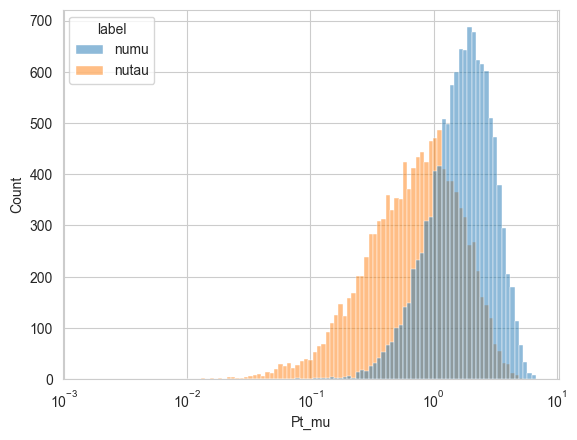

In [89]:
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = True, planes = "", IP=False)
construct_params(df_1_geant4)
sns.histplot(x = df_1_geant4["Pt_mu"], hue = df_1_geant4["label"], log_scale=True)

<Axes: xlabel='Pt_mu', ylabel='Count'>

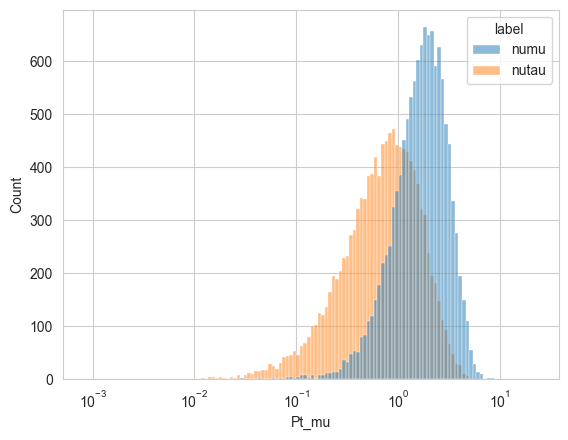

In [91]:
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = True, planes = "", IP=True)
construct_params(df_1_geant4)
sns.histplot(x = df_1_geant4["Pt_mu"], hue = df_1_geant4["label"], log_scale=True)

In [92]:
df_1_geant4

,Event,px_mu,py_mu,pz_mu,E_mu,IP,weight,px_hadr,py_hadr,pz_hadr,...,Pt_hadr,Pt_mu,Pt_mu_old,P_mu_old,Pt_hadr_old,P_hadr_old,anglePtmissandPtmuon,anglePtmissandPthadr,anglePtmuonandPthadr,anglePhadrandPmuon
0,0,-2.952162,-1.295885,32.178738,32.339856,0.005410,1.000000,3.206247,1.447830,48.667415,...,3.517987,3.224063,3.224062,32.339848,3.517987,48.79440,172.819871,6.577463,0.602665,9.855878
1,1,-2.210471,0.149033,42.517348,42.575042,0.003928,1.000000,2.553120,-0.206239,29.522390,...,2.561436,2.215490,2.215490,42.575031,2.561436,29.63330,174.378814,4.860022,0.761164,7.941407
2,2,-0.423303,-0.195891,19.471686,19.477304,0.008799,1.000000,0.341805,0.346352,36.829185,...,0.486611,0.466432,0.466432,19.477272,0.486611,36.83240,86.391005,73.063711,20.545283,2.097944
3,3,-1.856559,-3.245440,29.447076,29.683517,0.005923,1.000000,1.816493,3.280117,31.756412,...,3.749509,3.738945,3.738943,29.683497,3.749509,31.97700,101.104593,78.100831,0.794576,13.969669
4,4,-1.607252,1.319431,7.062754,7.362557,0.022090,1.000000,1.906983,-1.561248,48.678951,...,2.464565,2.079472,2.079461,7.362517,2.464565,48.74130,179.512432,0.411381,0.076187,19.304165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12132,12770,0.474936,0.969955,19.706749,19.736341,0.014515,303.459225,0.295144,-1.918159,18.523209,...,1.940732,1.079991,1.079990,19.736320,1.940732,18.62460,114.829776,30.334257,34.835967,8.740874
12133,12771,-0.022367,-0.601501,15.225883,15.237795,0.007597,303.459225,-2.034412,0.826599,11.960283,...,2.195928,0.601918,0.601917,15.237776,2.195928,12.16020,94.116098,15.866624,70.017278,11.375869
12134,12772,-0.286242,0.008719,14.549475,14.552340,0.023901,303.459225,2.328862,-2.500030,13.608748,...,3.416687,0.286376,0.286375,14.552293,3.416687,14.03110,131.093028,3.621662,45.285309,14.908149
12135,12773,0.325798,0.439505,24.387621,24.393790,0.013052,303.459225,-0.410692,-2.446001,3.646535,...,2.480240,0.547092,0.547091,24.393756,2.480240,4.41008,145.873791,7.108530,27.017679,35.371199


# Normalization attempts

In [7]:
# Author:  Raghav RV <rvraghav93@gmail.com>
#          Guillaume Lemaitre <g.lemaitre58@gmail.com>
#          Thomas Unterthiner
# License: BSD 3 clause

import matplotlib as mpl
import numpy as np
from matplotlib import cm
from matplotlib import pyplot as plt

from sklearn.datasets import fetch_california_housing
from sklearn.preprocessing import (
    MaxAbsScaler,
    MinMaxScaler,
    Normalizer,
    PowerTransformer,
    QuantileTransformer,
    RobustScaler,
    StandardScaler,
    minmax_scale,
)

X_full, y_full = df_1_geant4.drop(columns=["Event", "label"]), df_1_geant4.label.map({"numu": 0, "nutau": 1})
#feature_names = dataset.feature_names

# feature_mapping = {
#     "MedInc": "Median income in block",
#     "HouseAge": "Median house age in block",
#     "AveRooms": "Average number of rooms",
#     "AveBedrms": "Average number of bedrooms",
#     "Population": "Block population",
#     "AveOccup": "Average house occupancy",
#     "Latitude": "House block latitude",
#     "Longitude": "House block longitude",
# }

# Take only 2 features to make visualization easier
# Feature MedInc has a long tail distribution.
# Feature AveOccup has a few but very large outliers.
features = ["Pt_miss", "E_mu"]
features_idx = features
X = X_full[["Pt_miss", "E_mu"]].values
distributions = [
    ("Unscaled data", X),
    ("Data after standard scaling", StandardScaler().fit_transform(X)),
    ("Data after min-max scaling", MinMaxScaler().fit_transform(X)),
    ("Data after max-abs scaling", MaxAbsScaler().fit_transform(X)),
    (
        "Data after robust scaling",
        RobustScaler(quantile_range=(25, 75)).fit_transform(X),
    ),
    (
        "Data after power transformation (Yeo-Johnson)",
        PowerTransformer(method="yeo-johnson").fit_transform(X),
    ),
    (
        "Data after power transformation (Box-Cox)",
        PowerTransformer(method="box-cox").fit_transform(X),
    ),
    (
        "Data after quantile transformation (uniform pdf)",
        QuantileTransformer(
            output_distribution="uniform", random_state=42
        ).fit_transform(X),
    ),
    (
        "Data after quantile transformation (gaussian pdf)",
        QuantileTransformer(
            output_distribution="normal", random_state=42
        ).fit_transform(X),
    ),
    ("Data after sample-wise L2 normalizing", Normalizer().fit_transform(X)),
]

# scale the output between 0 and 1 for the colorbar
y = minmax_scale(y_full)

# plasma does not exist in matplotlib < 1.5
cmap = getattr(cm, "plasma_r", cm.hot_r)


def create_axes(title, figsize=(16, 6)):
    fig = plt.figure(figsize=figsize)
    fig.suptitle(title)

    # define the axis for the first plot
    left, width = 0.1, 0.22
    bottom, height = 0.1, 0.7
    bottom_h = height + 0.15
    left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.1]
    rect_histy = [left_h, bottom, 0.05, height]

    ax_scatter = plt.axes(rect_scatter)
    ax_histx = plt.axes(rect_histx)
    ax_histy = plt.axes(rect_histy)

    # define the axis for the zoomed-in plot
    left = width + left + 0.2
    left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.1]
    rect_histy = [left_h, bottom, 0.05, height]

    ax_scatter_zoom = plt.axes(rect_scatter)
    ax_histx_zoom = plt.axes(rect_histx)
    ax_histy_zoom = plt.axes(rect_histy)

    # define the axis for the colorbar
    left, width = width + left + 0.13, 0.01

    rect_colorbar = [left, bottom, width, height]
    ax_colorbar = plt.axes(rect_colorbar)

    return (
        (ax_scatter, ax_histy, ax_histx),
        (ax_scatter_zoom, ax_histy_zoom, ax_histx_zoom),
        ax_colorbar,
    )


def plot_distribution(axes, X, y, hist_nbins=50, title="", x0_label="", x1_label=""):
    ax, hist_X1, hist_X0 = axes

    ax.set_title(title)
    ax.set_xlabel(x0_label)
    ax.set_ylabel(x1_label)

    # The scatter plot
    colors = cmap(y)
    ax.scatter(X[:, 0], X[:, 1], alpha=0.5, marker="o", s=5, lw=0, c=colors)

    # Removing the top and the right spine for aesthetics
    # make nice axis layout
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))

    # Histogram for axis X1 (feature 5)
    hist_X1.set_ylim(ax.get_ylim())
    hist_X1.hist(
        X[:, 1], bins=hist_nbins, orientation="horizontal", color="grey", ec="grey"
    )
    hist_X1.axis("off")

    # Histogram for axis X0 (feature 0)
    hist_X0.set_xlim(ax.get_xlim())
    hist_X0.hist(
        X[:, 0], bins=hist_nbins, orientation="vertical", color="grey", ec="grey"
    )
    hist_X0.axis("off")
def make_plot(item_idx):
    title, X = distributions[item_idx]
    ax_zoom_out, ax_zoom_in, ax_colorbar = create_axes(title)
    axarr = (ax_zoom_out, ax_zoom_in)
    plot_distribution(
        axarr[0],
        X,
        y,
        hist_nbins=200,
        x0_label=features[0],
        x1_label=features[1],
        title="Full data",
    )

    # zoom-in
    zoom_in_percentile_range = (0, 99)
    cutoffs_X0 = np.percentile(X[:, 0], zoom_in_percentile_range)
    cutoffs_X1 = np.percentile(X[:, 1], zoom_in_percentile_range)

    non_outliers_mask = np.all(X > [cutoffs_X0[0], cutoffs_X1[0]], axis=1) & np.all(
        X < [cutoffs_X0[1], cutoffs_X1[1]], axis=1
    )
    plot_distribution(
        axarr[1],
        X[non_outliers_mask],
        y[non_outliers_mask],
        hist_nbins=50,
        x0_label=features[0],
        x1_label=features[1],
        title="Zoom-in",
    )

    norm = mpl.colors.Normalize(y_full.min(), y_full.max())
    mpl.colorbar.ColorbarBase(
        ax_colorbar,
        cmap=cmap,
        norm=norm,
        orientation="vertical",
        label="Color mapping for values of y",
    )

NameError: name 'df_1_geant4' is not defined

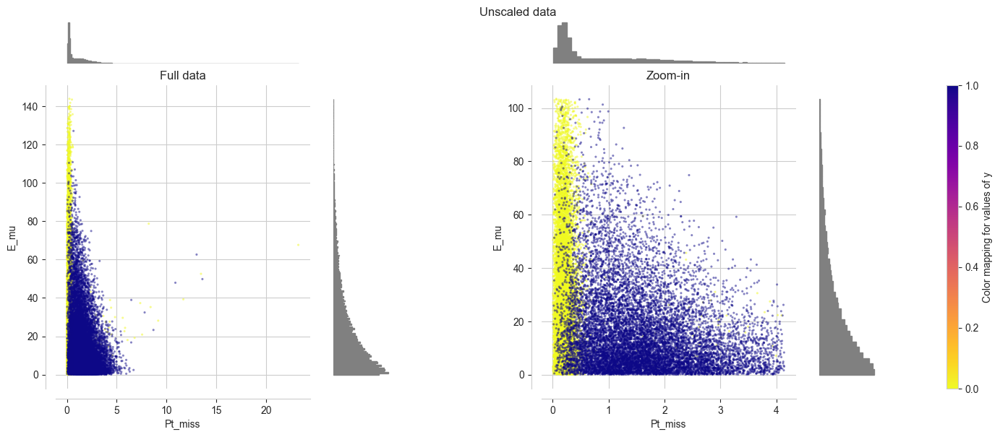

In [104]:
make_plot(0)

## Z-norm

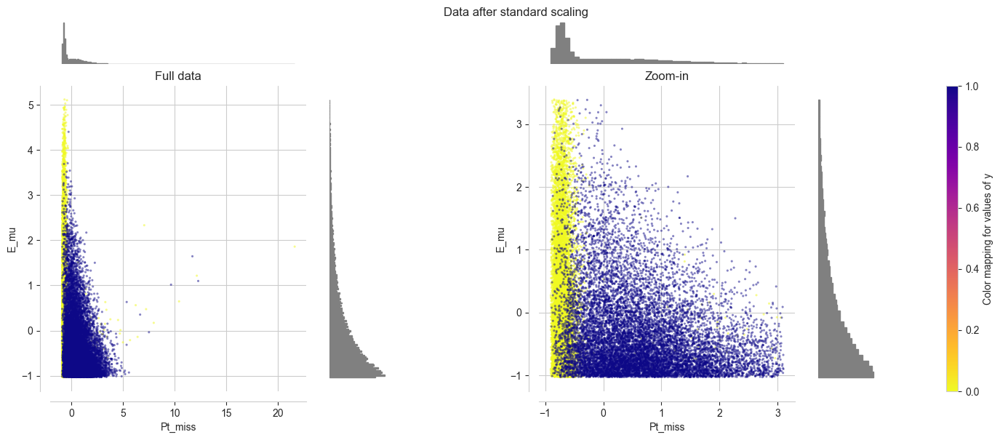

In [105]:
make_plot(1)

## Minmax

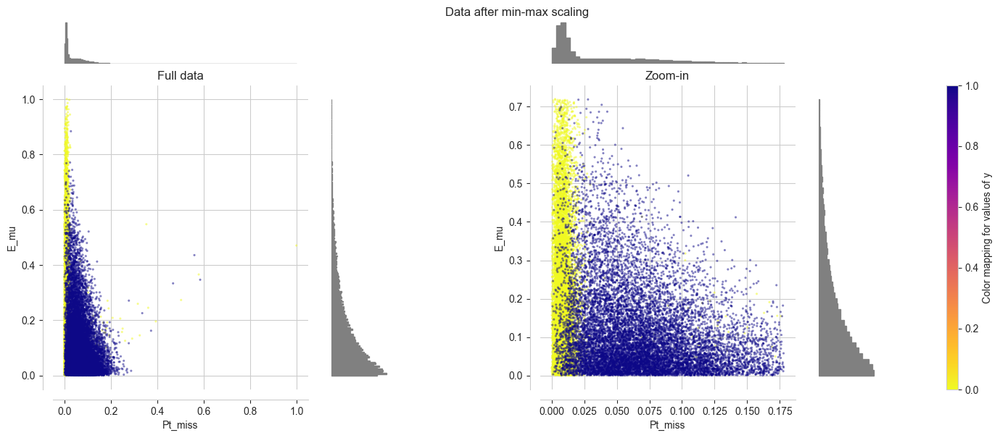

In [106]:
make_plot(2)

## MaxAbsScaler

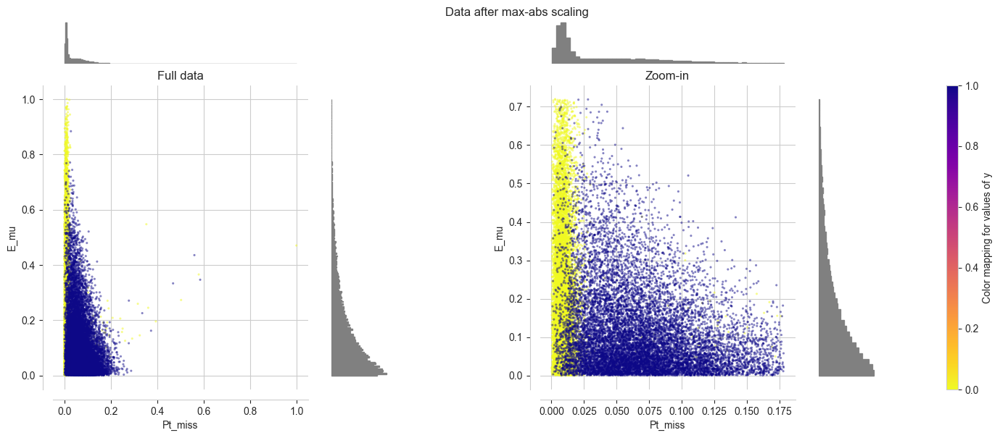

In [107]:
make_plot(3)

## RobustScaler

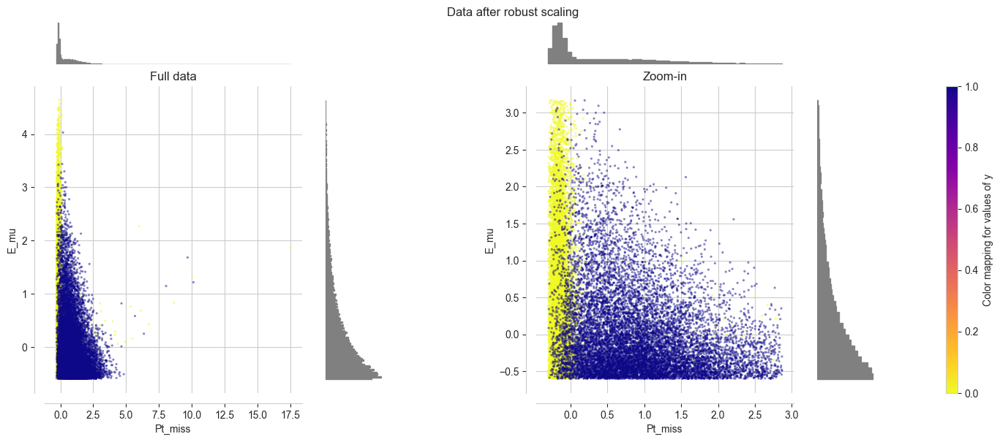

In [108]:
make_plot(4)

## PowerTransformer

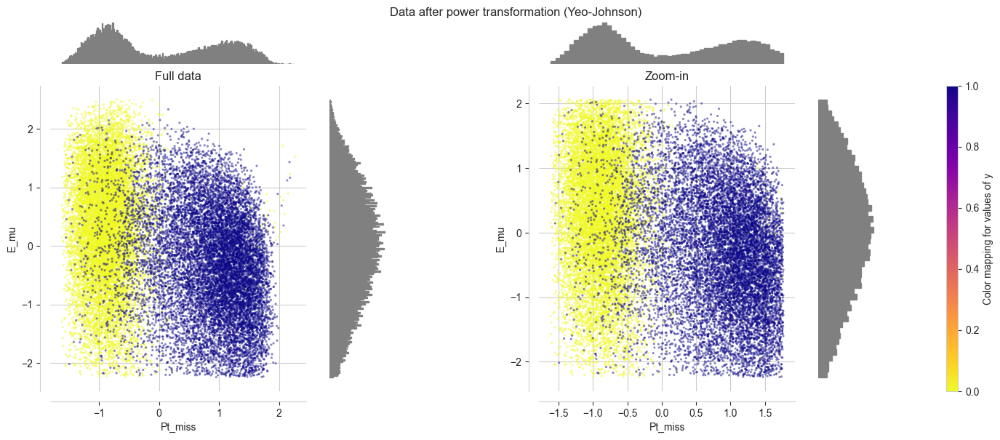

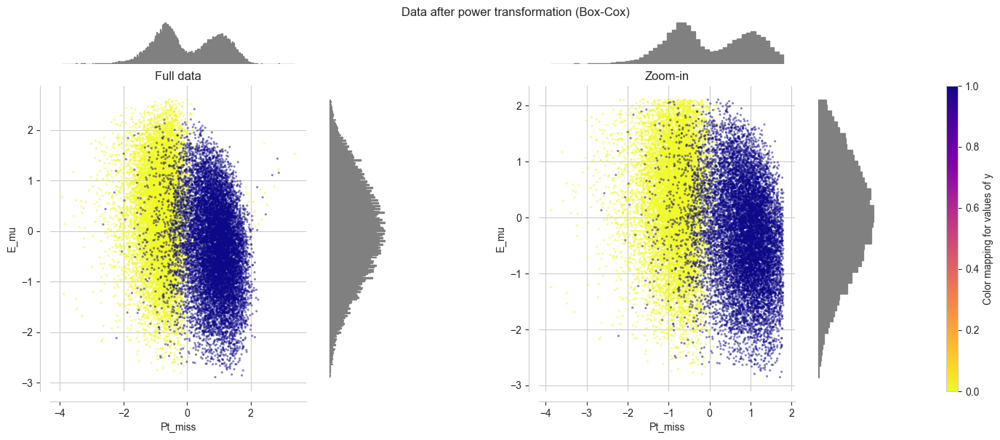

In [109]:
make_plot(5)
make_plot(6)

## QuantileTransformer (uniform output)

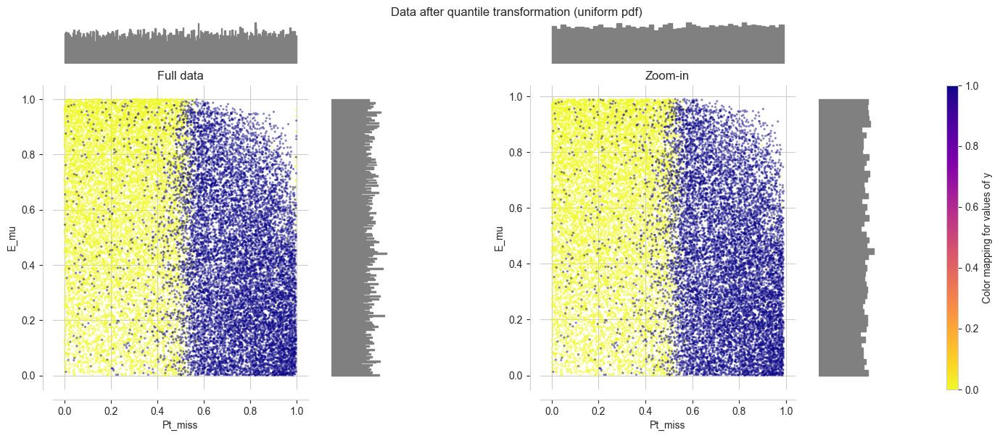

In [110]:
make_plot(7)

## QuantileTransformer (Gaussian output)

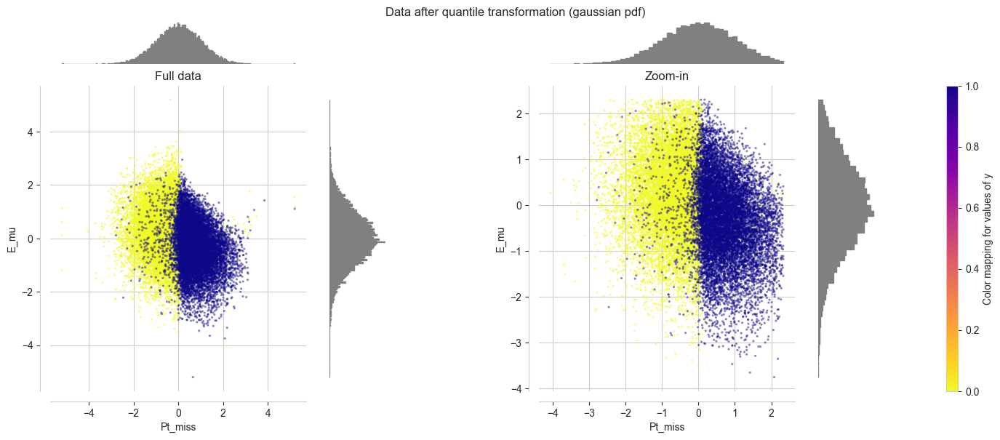

In [111]:
make_plot(8)

## Normalizer

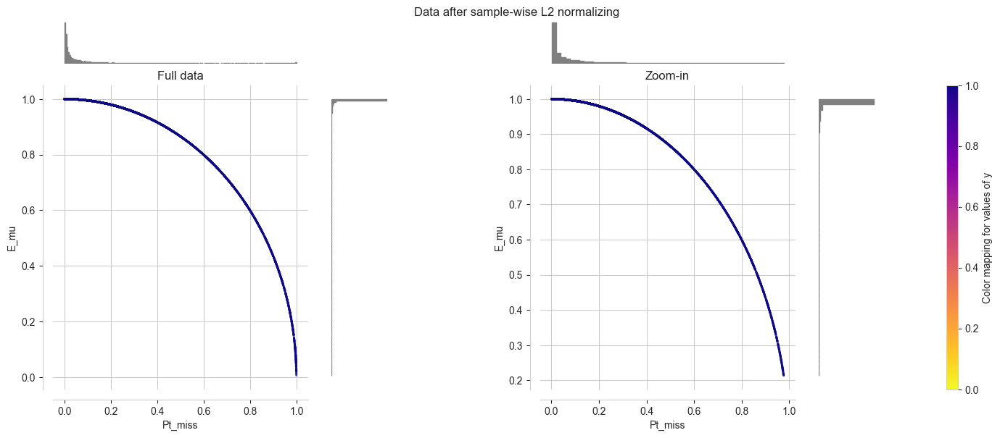

In [112]:
make_plot(9)

In [510]:
for part in ["mu", "tau"]:
    df_geant4[part].to_csv(f"notebooks/{part}.csv")

In [22]:
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = False, planes = "", IP=False, p_cut=0.5)

In [23]:
df_1_geant4

,Event,px_mu,py_mu,pz_mu,E_mu,weight,px_hadr,py_hadr,pz_hadr,E_hadr,label,Number,id,m_id,name,final,Xin,Yin,Zin
0,0,-3.025240,-1.341180,32.353200,32.522100,303.459225,3.025365,1.846329,47.396950,48.594410,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,-2.293630,0.135870,42.693800,42.755800,303.459225,2.397292,-0.478402,28.230935,28.882527,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,-0.478490,-0.208869,19.664900,19.672100,303.459225,0.391164,0.296876,35.236215,36.076200,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,-1.927270,-3.269630,29.681600,29.923500,303.459225,1.841688,3.402453,30.512806,32.004037,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,-1.716130,1.390300,7.321300,7.647910,303.459225,1.953248,-1.785570,47.259590,47.684690,numu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18343,18619,-1.914198,-2.628879,55.270583,55.366268,1.000000,3.044743,5.753993,43.711603,47.661816,nutau,4.0,13.0,0.0,muon,1.0,-1.80910,2.76021,-1.39530
18344,18620,1.620622,-0.929789,21.086426,21.169304,1.000000,-2.977889,2.862840,30.782224,31.601244,nutau,4.0,13.0,0.0,muon,1.0,-1.48577,1.35227,3.48305
18345,18621,0.581210,-2.155967,14.241665,14.416039,1.000000,-0.145473,3.596977,66.349350,66.517330,nutau,4.0,13.0,0.0,muon,1.0,1.54521,3.60468,-3.10092
18346,18622,-0.529505,0.301852,42.025777,42.030330,1.000000,-0.419330,-0.567004,14.006387,14.722790,nutau,4.0,13.0,0.0,muon,1.0,-1.44688,2.27545,-2.68844


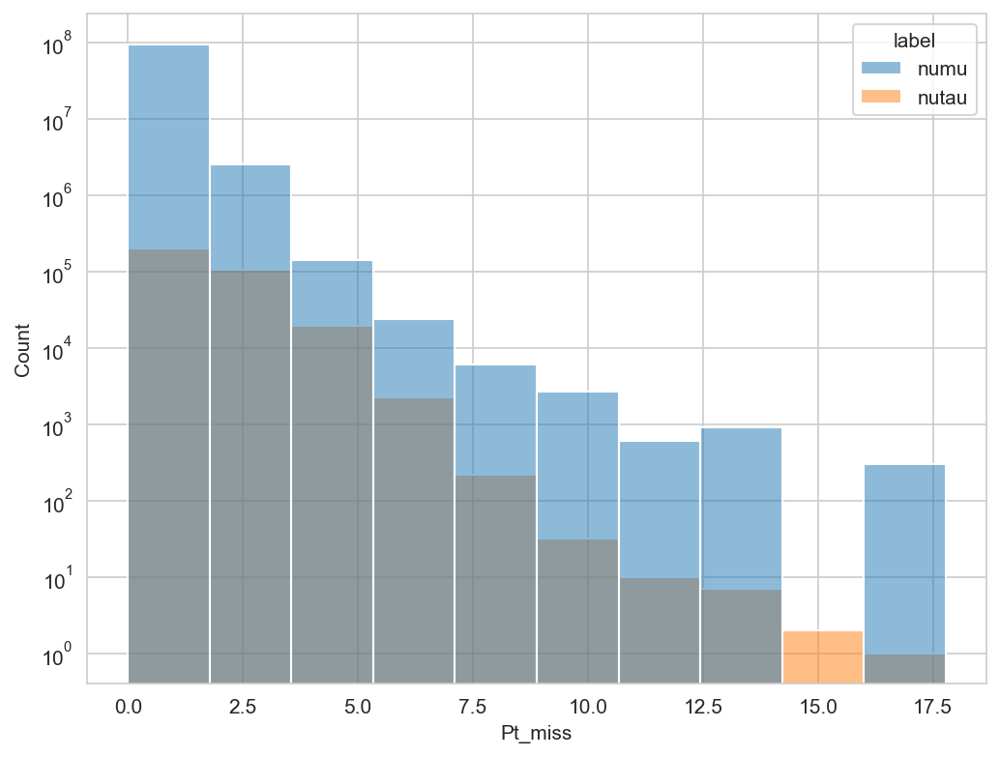

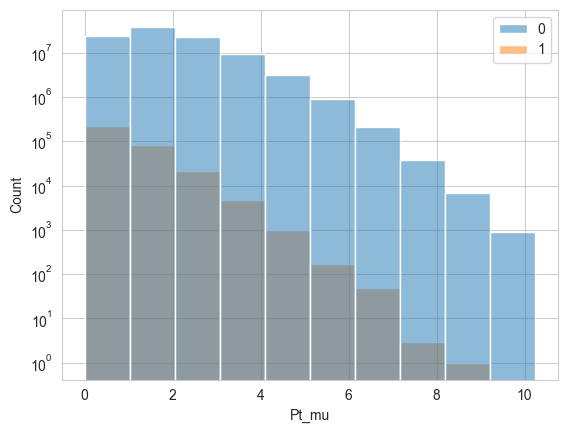

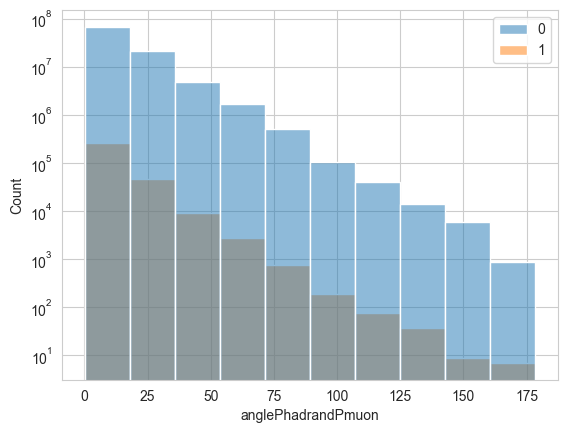

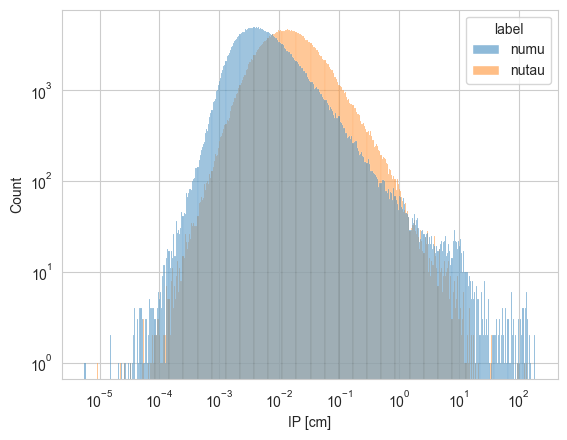

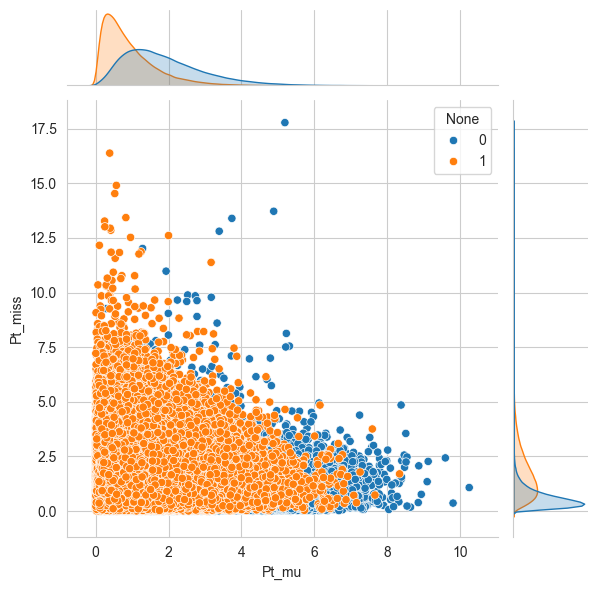

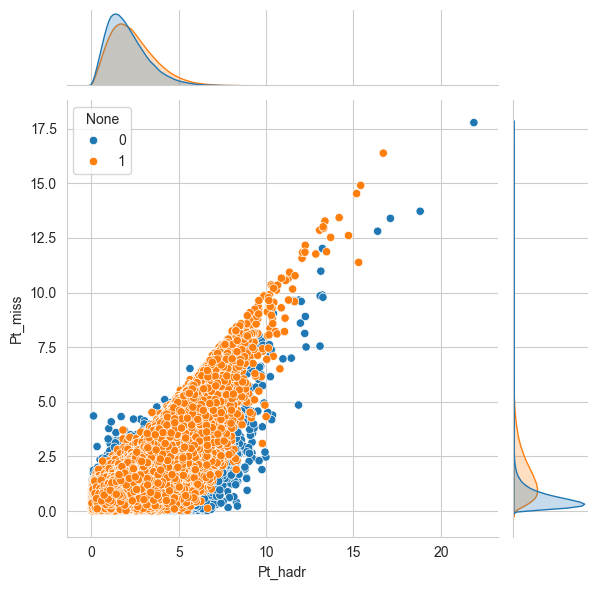

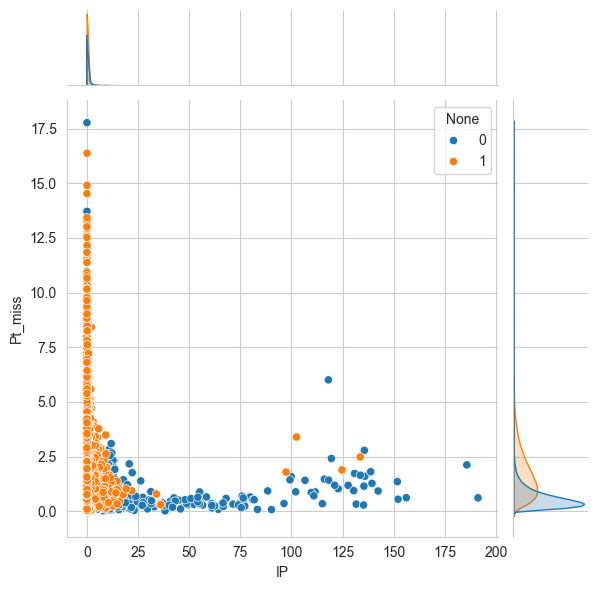

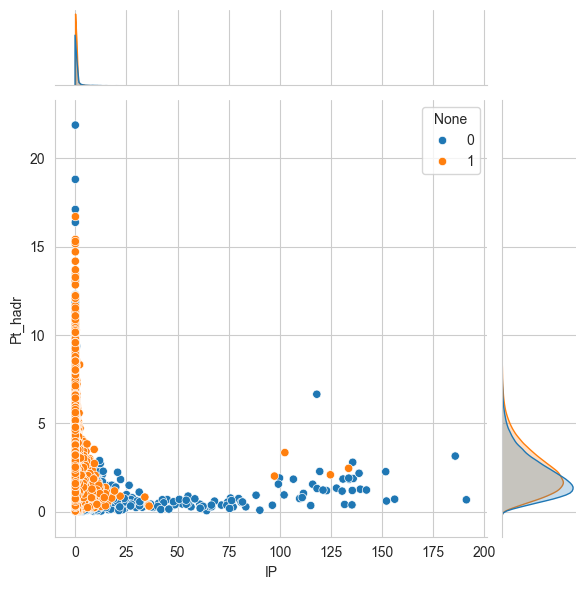

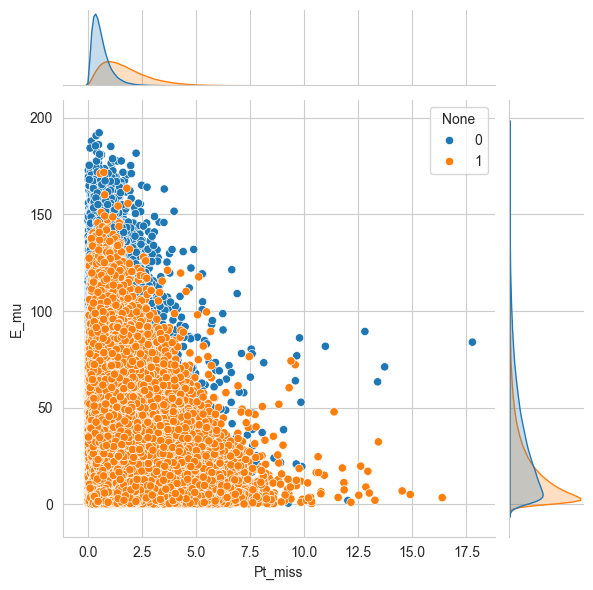

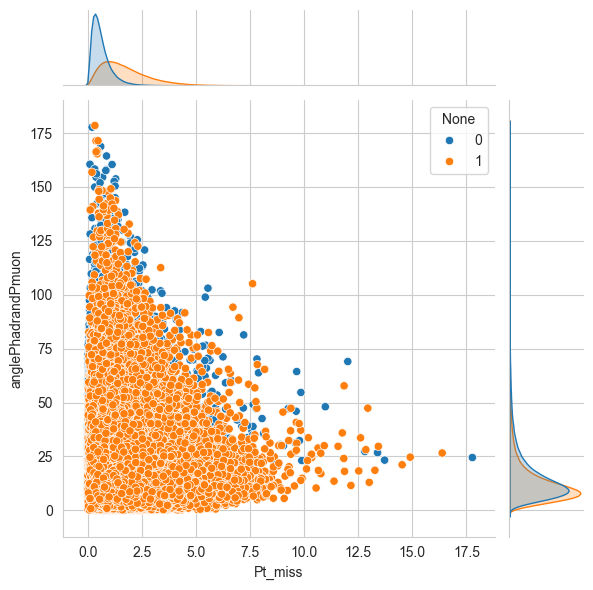

In [451]:
from sklearn.cluster import DBSCAN
from sklearn.ensemble import IsolationForest
neutrals = [
            #"neutron", "antineutron", "proton", "antiproton", 
            'nu_e_bar', 'nu_e', 'nu_mu_bar', 'nu_mu', 'nu_tau', 'nu_tau_bar', 
            ]
IP_on = True
df_1_geant4 = extract_info(df_geant4, neutrals = neutrals, ideal = False, planes = "", IP=IP_on, p_cut=0.5, big_stat=True)
construct_params(df_1_geant4, smearing=True)
# Update the 'weight' column based on the 'label'
df_1_geant4.loc[df_1_geant4['label'] == 'numu', 'weight'] = 300.0  # Set weight to 300 for 'numu'
df_1_geant4.loc[df_1_geant4['label'] == 'nutau', 'weight'] = 1.0   

IP_on = False
if IP_on:
    IP_cond = (df_1_geant4["anglePhadrandPmuon"] < 10.) 
    #& (df_1_geant4["IP"] < .6) & (df_1_geant4["IP"] > .01)
    #& (df_1_geant4["IP"] < .6)
    #& (df_1_geant4["IP"] < .6)
    #& (df_1_geant4["IP"] > .1)
    #& (df_1_geant4["IP"] > .1)
    #df_1_geant4["IP"] = df_1_geant4["IP"].apply(lambda x: x if x > 0.1 else 0.0)
    #& (df_1_geant4["IP"] < .6)
    # (df_1_geant4["IP"] > .01)  & 
    #& (df_1_geant4["anglePhadrandPmuon"] < 35.)
    #& (df_1_geant4["Pt_mu"] < 1.)
    #& ((df_1_geant4["Pt_miss"] < 2.5))
    #& (df_1_geant4["Pt_mu"] < 1.) & (df_1_geant4["Pt_hadr"] > 1.) & (df_1_geant4["Pt_miss"] > 3.)
    df_vis = df_1_geant4.loc[IP_cond]
else:
    df_vis = df_1_geant4
    # .loc[(df_1_geant4["Pt_miss"] > .9) & (df_1_geant4["E_mu"] < 100.)]
#df_vis = df_1_geant4
# X, y = df_vis.drop(columns=["Event", "label",
#                             "px_mu", "py_mu", "pz_mu", 
#                             "px_hadr", "py_hadr", "pz_hadr",
#                             "px_miss", "py_miss"]), df_vis.label.map({"numu": 0, "nutau": 1}).values
X, y, weights = df_vis.drop(columns=["Event", "label",
                            # "px_mu", "py_mu", "pz_mu", 
                            # "px_hadr", "py_hadr", "pz_hadr",
                            # "px_miss", "py_miss", 
                            'Pt_mu_old', 'P_mu_old', 'Pt_hadr_old', 'P_hadr_old',
                                     "weight", "label"]).dropna(axis = 1), df_vis.label.map({"numu": 0, "nutau": 1}).values, df_vis["weight"].values

X_cols = X.columns


iso_forest = IsolationForest(contamination=0.1, random_state=42)
outliers = iso_forest.fit_predict(X)

# Filter the data, keeping only non-outliers (where outliers != -1)
# X["label"] = y
# nutaus_old = len(y[y == 1])
# numus_old = len(y[y == 0])
# X["weight"] = weights
# X = X[outliers != -1]
# y = X["label"].values
# weights = X["weight"].values
# print("nutaus: ", len(y[y == 1])/nutaus_old, "numus: ", len(y[y == 0])/numus_old)
# X = X.drop(columns = ["label", "weight"])

#X = pd.DataFrame(PowerTransformer(method="yeo-johnson").fit_transform(X))
#X = pd.DataFrame(PowerTransformer(method="box-cox").fit_transform(X))
#X = pd.DataFrame(StandardScaler().fit_transform(X))
#print(len(X), y[y == 1].shape, len(weights))
# X = pd.DataFrame(QuantileTransformer(
#              output_distribution="normal", random_state=42
#          ).fit_transform(X))
X.columns = X_cols
# X["label"] = pd.Series(y).map({0: "numu", 1: "nutau"})
# X = unroll_sample(X, 300)
# y = X["label"].map({"numu": 0, "nutau": 1}).values
# X = X.drop(columns = ["label"])
#df_vis = df_1_geant4
#df_vis = pd.concat([df_1_geant4.loc[df_1_geant4['label'] == 'numu'], df_1_geant4.loc[df_1_geant4['label'] == 'nutau'].sample(len(df_1_geant4.query("label == 'nutau'"))//300)])
#df_vis = df_vis.loc[(df_vis["IP"] > .005) & (df_vis["IP"] < .1)]
#X["label"] = y
plt.figure(figsize=(8, 6), dpi=150)
sns.histplot(x = X["Pt_miss"], hue = df_vis.label, 
             weights = weights,
             #log_scale=True
            )
plt.yscale("log")
plt.savefig("pt_miss.pdf")
plt.show()
sns.histplot(x = X["Pt_mu"], hue = y, 
             weights = weights,
             #log_scale=True
            )
plt.yscale("log")
plt.show()
sns.histplot(x = X["anglePhadrandPmuon"], hue = y, 
             weights = weights,
             #log_scale=True
            )
plt.yscale("log")
plt.show()
#sns.histplot(x = df_vis["E_hadr"], hue = df_vis["label"], log_scale=True)
sns.histplot(x = df_vis["IP"], hue = df_vis["label"], log_scale=True)
plt.xlabel("IP [cm]")
plt.yscale("log")
plt.show()
plot_density(X, label = y, params = ["Pt_mu", "Pt_miss"])
plot_density(X, label = y, params = ["Pt_hadr", "Pt_miss"])
plot_density(X, label = y, params = ["IP", "Pt_miss"])
plot_density(X, label = y, params = ["IP", "Pt_hadr"])
plot_density(X, label = y, params = ["Pt_miss", "E_mu"])
plot_density(X, label = y, params = ["Pt_miss", "anglePhadrandPmuon"])


In [255]:
3e10*(/1.777)*2.9e-13

0.4895891952729319

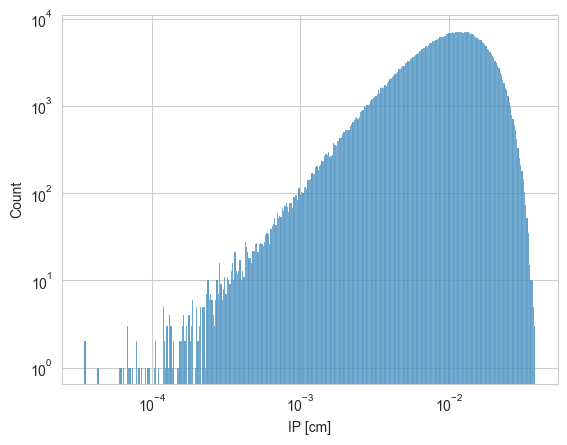

In [289]:
tau = df_geant4["tau"].query("id == 15")
theta = np.arccos(tau["pz"]/np.sqrt(tau["px"]**2 + tau["py"]**2 + tau["pz"]**2)) 
path_len = 3e10*(tau["E"]/1.777)*2.9e-13*np.sin(theta)
sns.histplot(x = path_len, log_scale=True)
plt.xlabel("IP [cm]")
plt.yscale("log")

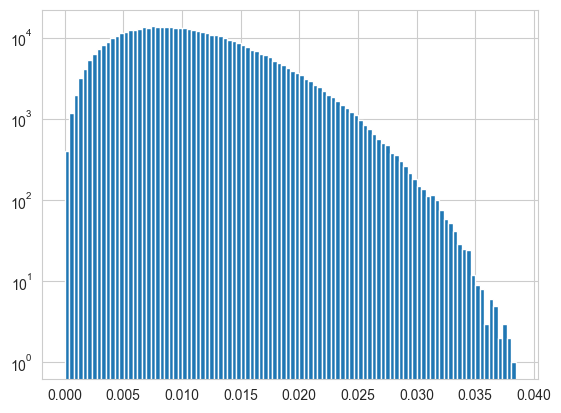

In [290]:
path_len.hist(bins = 100)
plt.yscale("log")

In [458]:
df_m

0         10.084043
1          7.879437
2          2.293082
3         14.155630
4         19.470030
            ...    
325406    10.765188
325407    10.414758
325408     6.830130
325409     8.563063
325410     7.760194
Name: anglePhadrandPmuon, Length: 649445, dtype: float64

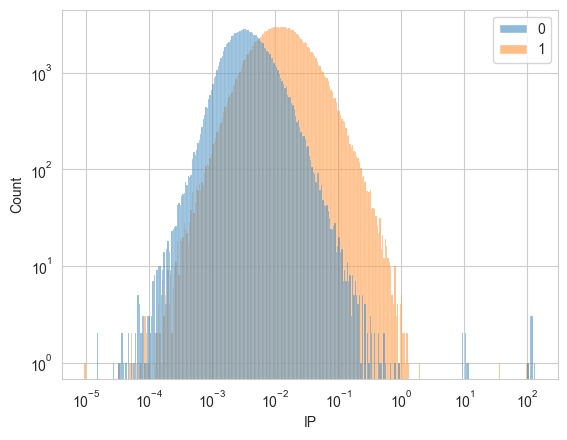

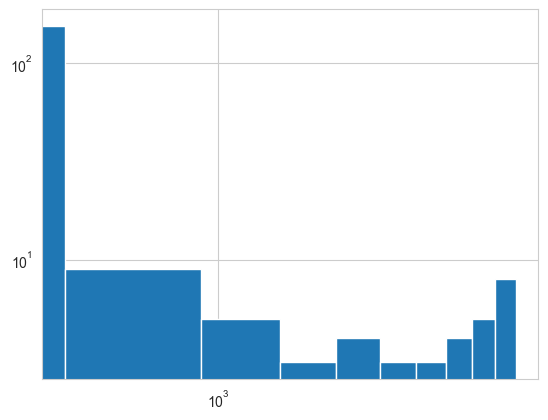

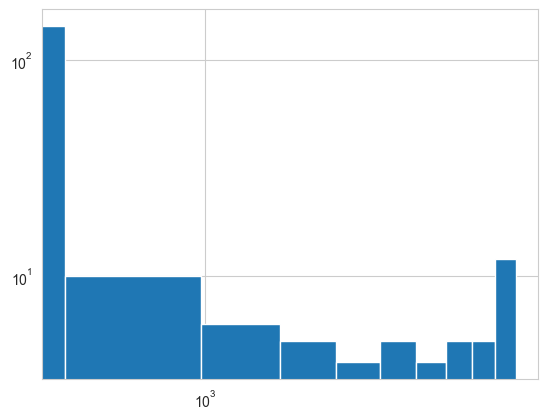

0.003109738781913162 0.010122475257470499
Difference between MPVs (class 1 - class 0): x: 0.007012736475557337


In [283]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def plot_density_sub(X, y, weights, label="label", params=None, height=6, dpi=100, bins=30):
    # Create the jointplot with a specified height
    sns.histplot(x = X[params], hue = y, 
                 #weights = weights,
                 log_scale=True
                )
    plt.yscale("log")
    plt.show()
    X[label] = y
    X["w"] = weights
    X = X.loc[X.IP < 1.]

    # Calculate MPV difference using histogram bins
    for lbl in [0, 1]:
        # Filter the data for the label
        data_x = X[X[label] == lbl][params]
        w_x = X[X[label] == lbl]["w"]
        # Create histograms for x and y data
        counts_x, bin_edges_x = np.histogram(data_x, bins=np.logspace(np.log10(1e-4), np.log10(1e2), 200))
        plt.hist(np.histogram(data_x, bins=np.logspace(np.log10(1e-5), np.log10(1e2), 200))[0])
        plt.xscale("log")
        plt.yscale("log")
        plt.show()
        # Find the bin with the maximum count for each parameter
        mpv_x = (bin_edges_x[np.argmax(counts_x)] + bin_edges_x[np.argmax(counts_x) + 1]) / 2
        
        # Store MPVs for each class
        if lbl == 0:
            mpv_class_0 = mpv_x
        else:
            mpv_class_1 = mpv_x
    
    # Calculate and print the difference between the MPVs
    mpv_difference = mpv_class_1 - mpv_class_0
    print(mpv_class_0, mpv_class_1)
    print(f"Difference between MPVs (class 1 - class 0): x: {mpv_difference}")

    # Show the plot
    plt.show()

plot_density_sub(X, y, weights, label = 'label', params = "IP")

NameError: name 'bins' is not defined

In [316]:
X_no_IP = X.drop(columns = ["IP"])
y_no_IP = y
weights_no_IP = weights

4766 (4600,) 4766


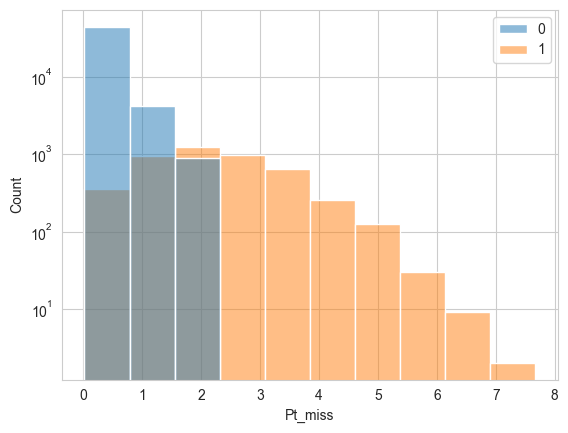

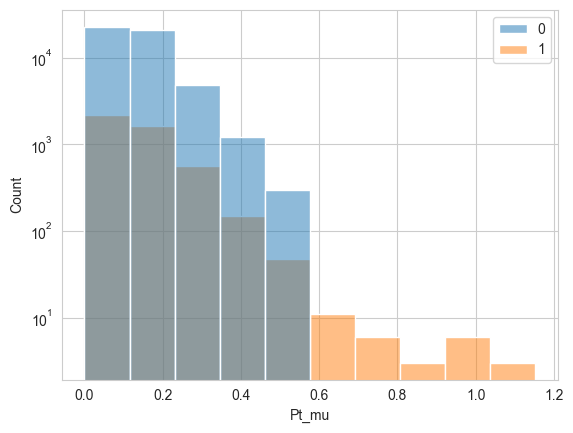

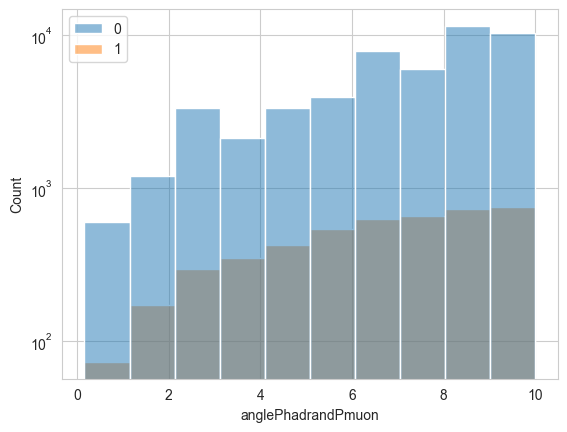

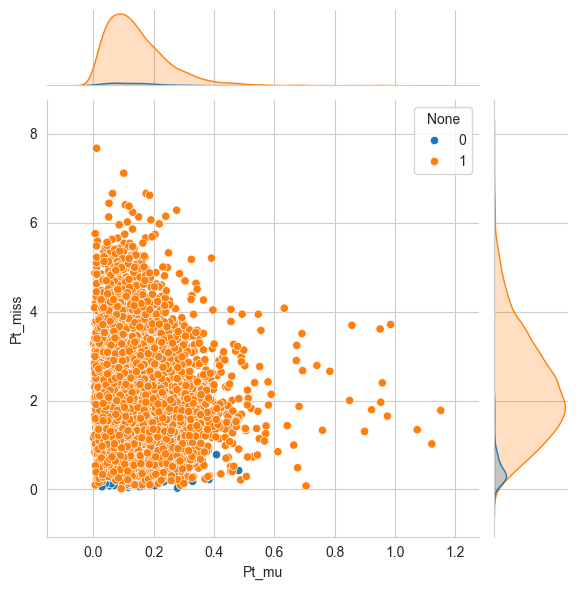

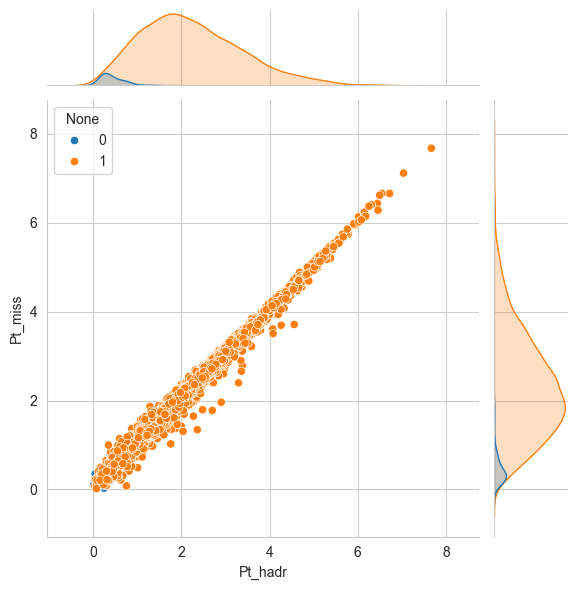

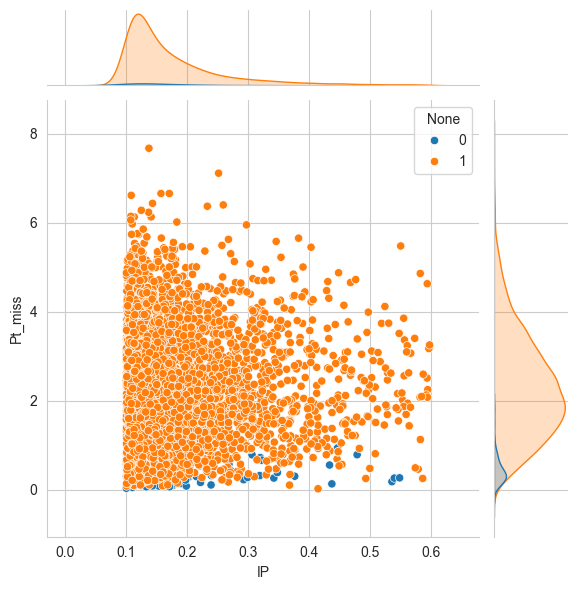

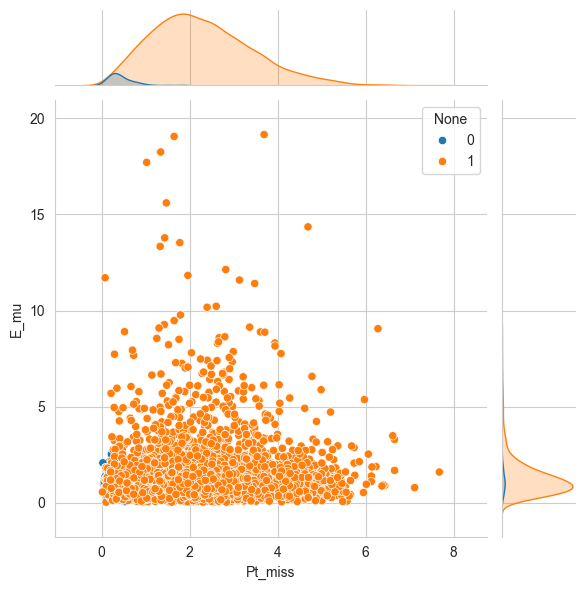

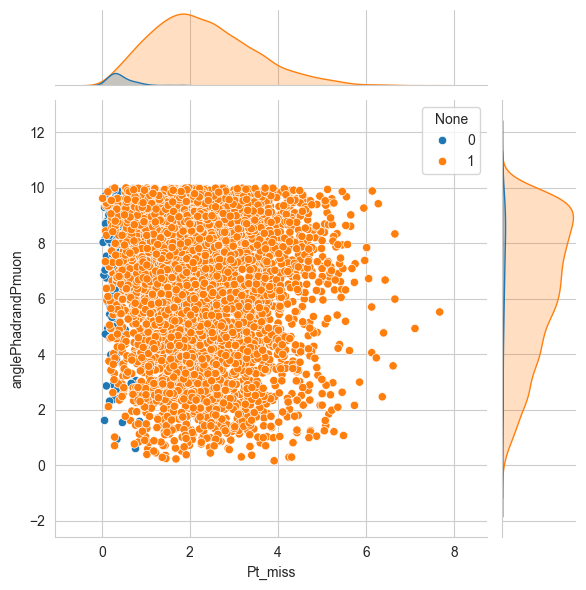

In [168]:
print(len(X), y[y == 1].shape, len(weights))
sns.histplot(x = X["Pt_miss"], hue = y, 
             weights = weights,
             #log_scale=True
            )
plt.yscale("log")
plt.show()
sns.histplot(x = X["Pt_mu"], hue = y, 
             weights = weights,
             #log_scale=True
            )
plt.yscale("log")
plt.show()
sns.histplot(x = X["anglePhadrandPmuon"], hue = y, 
             weights = weights,
             #log_scale=True
            )
plt.yscale("log")
plt.show()
#sns.histplot(x = df_vis["E_hadr"], hue = df_vis["label"], log_scale=True)
#sns.histplot(x = df_vis["IP"], hue = df_vis["label"], log_scale=True)
plot_density(X, label = y, params = ["Pt_mu", "Pt_miss"])
plot_density(X, label = y, params = ["Pt_hadr", "Pt_miss"])
plot_density(X, label = y, params = ["IP", "Pt_miss"])
plot_density(X, label = y, params = ["Pt_miss", "E_mu"])
plot_density(X, label = y, params = ["Pt_miss", "anglePhadrandPmuon"])

In [ ]:
9211 (6092,) 9211
10235 (6885,) 10235

In [489]:
6885 - 6092

793

In [490]:
10235 - 9211

1024

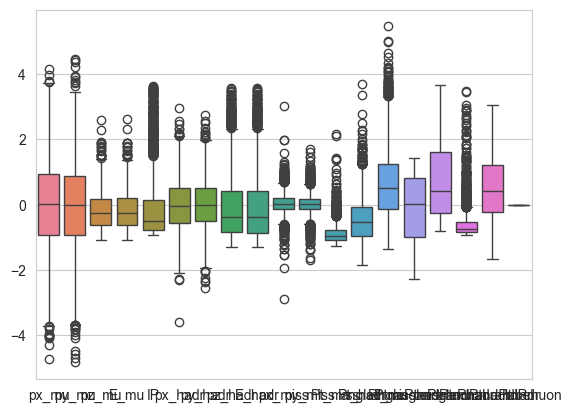

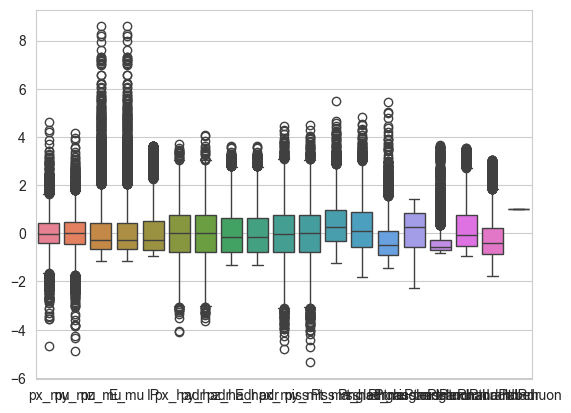

In [451]:
X["label"] = y
sns.boxplot(data=X.query("label == 0"))
plt.show()
sns.boxplot(data=X.query("label == 1"))
plt.show()

In [10]:
from sklearn.ensemble import IsolationForest

# Fit the Isolation Forest model
iso_forest = IsolationForest(contamination=0.1, random_state=42)
outliers = iso_forest.fit_predict(X)

# Filter the data, keeping only non-outliers (where outliers != -1)
X[outliers != -1]



,px_mu,py_mu,pz_mu,E_mu,px_hadr,py_hadr,pz_hadr,E_hadr,px_miss,py_miss,Pt_miss,Pt_hadr,Pt_mu,anglePtmissandPtmuon,anglePtmissandPthadr,anglePtmuonandPthadr,anglePhadrandPmuon
0,-3.025240,-1.341180,32.353200,32.522100,3.093164,1.887705,48.459113,48.594410,-0.067924,-0.546525,0.550729,3.623685,3.309216,120.993697,51.520454,7.485849,10.095514
1,-2.293630,0.135870,42.693800,42.755800,2.443480,-0.487620,28.774850,28.882527,-0.149850,0.351750,0.382338,2.491659,2.297663,116.464730,55.639733,7.895536,8.011452
2,-0.478490,-0.208869,19.664900,19.672100,0.400450,0.303924,36.072697,36.076200,0.078040,-0.095055,0.122986,0.502723,0.522098,74.196283,92.188919,13.614798,2.304494
3,-1.927270,-3.269630,29.681600,29.923500,1.916352,3.540392,31.749828,32.004037,0.010918,-0.270762,0.270982,4.025765,3.795401,147.173884,30.734971,2.091146,14.510750
4,-1.716130,1.390300,7.321300,7.647910,1.967735,-1.798813,47.610103,47.684690,-0.251605,0.408513,0.479779,2.666029,2.208836,160.641320,15.938762,3.419918,19.987299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99195,-0.236651,1.792857,28.295464,28.353391,-0.336760,-2.864980,14.932444,15.208530,0.573411,1.072123,1.215832,2.884704,1.808420,144.341078,21.435543,14.223378,14.506219
99196,0.632297,-1.094213,31.705833,31.731186,-0.974003,2.671819,12.931484,13.240490,0.341706,-1.577606,1.614188,2.843817,1.263772,162.199661,7.807805,9.992534,14.655922
99197,0.018526,-0.501929,0.860006,1.001524,-0.231659,0.619027,36.031284,36.037346,0.213133,-0.117098,0.243182,0.660954,0.505089,120.898745,40.697652,18.403604,31.285030
99198,-0.648098,0.217207,16.759987,16.774252,0.496187,-1.295747,6.024517,6.182230,0.151911,1.078540,1.089186,1.387502,0.683541,100.511037,28.970886,50.518077,14.564570


In [305]:
y[y == 0].shape, y[y == 1].shape

((14813,), (91554,))

In [454]:
91554/3e5

0.30518

In [455]:
df_1_geant4.query("weight == 1")

,Event,px_mu,py_mu,pz_mu,E_mu,IP,weight,px_hadr,py_hadr,pz_hadr,...,Pt_hadr,Pt_mu,Pt_mu_old,P_mu_old,Pt_hadr_old,P_hadr_old,anglePtmissandPtmuon,anglePtmissandPthadr,anglePtmuonandPthadr,anglePhadrandPmuon
0,0,0.487551,0.747024,37.171671,45.398221,0.014129,1.0,-1.139156,-3.961078,68.874757,...,4.121628,1.089156,0.892049,37.182373,4.121628,68.997971,158.329827,4.583968,17.086205,4.755842
1,1,1.744558,0.183658,13.836607,11.844227,0.003023,1.0,-3.746378,-0.266406,38.718940,...,3.755838,1.489682,1.754199,13.947362,3.755838,38.900676,176.357379,1.700423,1.942197,12.764085
2,2,0.803034,0.445958,14.980643,17.208162,0.011587,1.0,-3.600704,-0.413583,46.034483,...,3.624378,1.053159,0.918554,15.008778,3.624378,46.176939,150.291780,7.215379,22.492841,7.858803
3,3,-0.040270,-0.037909,14.547613,13.549858,0.006695,1.0,0.961816,-0.132079,8.259997,...,0.970842,0.051513,0.055306,14.547718,0.970842,8.316855,126.278958,2.632168,51.088874,6.842435
4,4,0.114552,-0.204569,5.537745,5.602943,0.031984,1.0,0.490574,2.466911,65.036920,...,2.515216,0.237006,0.234458,5.542706,2.515216,65.085539,135.777698,3.727595,40.494707,4.352889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325406,328730,-0.689554,0.409991,7.937947,5.740609,0.021096,1.0,1.413775,-0.144235,15.454192,...,1.421113,0.577223,0.802233,7.978382,1.421113,15.519394,129.114595,25.976036,24.909369,10.765188
325407,328731,0.081071,0.399557,2.225047,1.987405,0.027604,1.0,-1.522410,0.434905,45.950572,...,1.583312,0.358192,0.407699,2.262091,1.583312,45.977842,71.401096,14.125692,94.473212,10.414758
325408,328732,0.278752,0.326733,18.451533,19.628509,0.010934,1.0,0.239765,3.185846,23.138518,...,3.194855,0.456757,0.429485,18.456531,3.194855,23.358042,32.071866,4.093258,143.834876,6.830130
325409,328733,-0.696747,-0.278936,14.252249,17.744299,0.030715,1.0,2.224176,-0.917250,22.357390,...,2.405890,0.933102,0.750508,14.271996,2.405890,22.486467,120.116001,15.654550,44.229449,8.563063


# Oversampling of nutau

In [517]:
!pip install imblearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.3/258.3 kB 4.7 MB/s eta 0:00:004.7 MB/s eta 0:00:01


In [9]:
from imblearn.over_sampling import SMOTE
# Step 2: Apply SMOTE to oversample the minority class (class 1)

In [448]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
import optuna
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import DetCurveDisplay, RocCurveDisplay, PrecisionRecallDisplay
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import auc

np.random.seed(seed=42)

def plot_det(model, X_test, y_test, w_test):
    fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(12, 6), dpi = 150)

    RocCurveDisplay.from_estimator(model, X_test, y_test, 
                                   sample_weight=w_test, 
                                   ax=ax_roc)
    DetCurveDisplay.from_estimator(model, X_test, y_test, 
                                   sample_weight=w_test, 
                                   ax=ax_det)
    # PrecisionRecallDisplay.from_estimator(model, X_test, y_test, 
    #                                sample_weight=w_test, 
    #                                ax=ax_pr)
    ax_roc.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Tossing a coin", alpha=1.0)
    ax_roc.legend()
    ax_roc.set_title("Receiver Operating Characteristic (ROC) curve")
    ax_det.set_title("Detection Error Tradeoff (DET) curve")
    ax_roc.set_xlabel("False Positive rate of nutau events")
    ax_roc.set_ylabel("True Positive rate of nutau events")
    ax_det.set_xlabel("False Positive rate of nutau events")
    ax_det.set_ylabel("False Negative rate of nutau events")
    # ax_det.set_xlabel("False Positive rate of nutau events")
    # ax_det.set_ylabel("False Negative rate of nutau events (= efficiency)")
    ax_roc.grid(linestyle="--")
    ax_det.grid(linestyle="--")
    
    plt.legend()
    fig.savefig("roc_auc.pdf")
    plt.show()


def roc_auc_plot(X, y, weights, params):
                # Run classifier with cross-validation and plot ROC curves
        #cv = StratifiedKFold(n_splits=6)
        cv = StratifiedKFold(n_splits=6, shuffle=True, random_state=42)
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        model = lgb.LGBMClassifier(**params, verbose = -1)
        # y = df_muon_2["label"].map({'numu':0,'nutau':1}).values

        fig, ax = plt.subplots(figsize=(12, 8), dpi=100)
        plt.grid()

        # Assuming weights is an array of sample weights corresponding to the samples in X
        # weights = df_muon_2['weight_mu'].values
        train_0, test_0 = 0, 0
        for i, (train, test) in enumerate(cv.split(X, y)):
            print(train, test)
            # if train_0 == train:
            #     print("similar")
            # train_0 = train
            model.fit(X[train], y[train], sample_weight=weights[train])
            viz = RocCurveDisplay.from_estimator(
                model,
                X[test],
                y[test],
                sample_weight=weights[test],  # Use sample weights for the ROC computation
                name="ROC fold {}".format(i),
                alpha=0.3,
                lw=1,
                ax=ax,
            )
            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)

        ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        ax.plot(
            mean_fpr,
            mean_tpr,
            color="b",
            label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
            lw=2,
            alpha=0.8,
        )

        std_tpr = np.std(tprs, axis=0)
        tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
        tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
        ax.fill_between(
            mean_fpr,
            tprs_lower,
            tprs_upper,
            color="grey",
            alpha=0.2,
            label=r"$\pm$ 1 std. dev.",
        )

        ax.set(
            xlim=[-0.05, 1.05],
            ylim=[-0.05, 1.05],
            title="ROC-AUC metrics",
        )
        ax.legend(loc="lower right")
        plt.show()

def my_metric(y_true, y_pred, sample_weight):
    conf_mat = confusion_matrix(y_true, y_pred, sample_weight = sample_weight)
    return conf_mat[1][1]/(conf_mat[0][1] + conf_mat[1][1]) 
                          
def bootstrap_metric(x, 
                    y,
                    w,
                    metric_fn,
                    samples_cnt = 200,
                    alpha = 0.05,
                    random_state = 42):
    
    np.random.seed(random_state)
    b_metric = np.zeros(samples_cnt)
    for it in range(samples_cnt):
        poses = np.random.choice(x.shape[0], size=x.shape[0], replace=True)
        #print("CHECK: ", poses, x)
        x_boot = x[poses]
        y_boot = y[poses]
        w_boot = w[poses]
        
        m_val = metric_fn(x_boot, y_boot, w_boot)
        b_metric[it] = m_val
        if it%50 == 0:
            print(it, "times...")
    
    return b_metric

def hyperparam_opt(X_train, X_test, y_train, y_test, w_train, w_test):
    study = optuna.create_study(direction="maximize")
    def objective(trial):
        # Determine the hyperperatemers and their value ranges
        learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
        num_leaves = trial.suggest_int("num_leaves", 2, 256)
        max_depth = trial.suggest_int("max_depth", -1, 50)
        min_child_samples = trial.suggest_int("min_child_samples", 5, 100)
        subsample = trial.suggest_float("subsample", 0.5, 1.0)
        colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)
        n_estimators = trial.suggest_int("n_estimators", 1, 1000)
        min_split_gain = trial.suggest_int("min_split_gain", 0, 10)
        reg_lambda = trial.suggest_int("reg_lambda", 0, 10.)

        # Create and train the model
        model = lgb.LGBMClassifier(
        learning_rate=learning_rate,
        num_leaves=num_leaves,
        max_depth=max_depth,
        min_child_samples=min_child_samples,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        n_estimators=n_estimators,
        min_split_gain=min_split_gain,
        reg_lambda=reg_lambda,
        #random_state=42,
        verbose = -1
        )
        model.fit(X_train, y_train, sample_weight=w_train)
        
        # Evaluate model and return the metric
        y_pred = model.predict(X_test)
        accuracy = my_metric(y_test, y_pred, sample_weight=w_test)
        return accuracy     


    study.optimize(objective, n_trials=20)
    print("Best trial:")
    print(" Value: {}".format(study.best_trial.value))
    print(" Params: {}".format(study.best_trial.params))
    return study.best_trial.params
def train_and_get_results(X, y, weights, SMOTE_on = False):
    # Sample Data (Replace with your own dataset)
    # Assume X is your feature matrix and y is the target variable (0/1 classification)
    # For demonstration, let's create a random dataset
    feature_names = X.columns
    if SMOTE_on:
        X_0 = X.copy()
        X_0["label"] = y
        #X_tau = X_0.loc[X_0.label == 1].sample(len(X_0.loc[X_0.label == 1])//6)
        X_tau = X_0.loc[X_0.label == 1]
        #X_mu = X_0.loc[X_0.label == 0].sample(len(X_0.loc[X_0.label == 0])//3)
        X_mu = X_0.loc[X_0.label == 0]
        X_0 = pd.concat([X_mu, X_tau])
        y = X_0["label"]
        X_0 = X_0.drop(columns = "label") 
        weights = np.array([1.]*len(X_mu["px_mu"]) + [1./300]*len(X_tau["px_mu"]))
        #y_0 = np.array([1]*len(y[y == 0]) + [0]*len(y[y == 1]))
        y_0 = y.values
        X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(X_0, y_0, weights, test_size=0.2, random_state=42)
        print(len(y[y==0]), len(y[y==1]))
    # Split the data
    # X = X.drop(columns = ["label"])
    else:
        X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(X, y.values, weights, test_size=0.2, random_state=42)
    # if SMOTE_on:
    #     smote = SMOTE(random_state=42)
    #     X_train, y_train = smote.fit_resample(X_train, y_train)
    # Define parameters for LightGBM
    #print(y_test, w_test, X_test)
    params = {
        'objective': 'binary',   # For binary classification
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'learning_rate': 0.1,
        'num_leaves': 100,
        'verbose': -1
    }
    
    #model = lgb.LGBMClassifier(**params, scale_pos_weight=len(y_train[y_train == 0])/len(y_train[y_train == 1]))
    params = hyperparam_opt(X_train, X_test, y_train, y_test, w_train, w_test)
    model = lgb.LGBMClassifier(**params, verbose = -1)
    # model = lgb.LGBMClassifier(boosting_type = "gbdt", objective='binary', metric='auc', 
    #                         max_depth=-1, 
    #                         n_estimators=100, 
    #                         num_leaves = 61,
    #                         min_child_samples = 60,
    #                         min_split_gain = 8,
    #                         reg_lambda = 10.0,
    #                         verbose = -1,
    #                         random=42
    #                         )
    #model = DecisionTreeClassifier(max_depth=-1, num_leaves = 31)
    model.fit(
        X_train, y_train,
        sample_weight=w_train,  
    )
    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_class = np.round(y_pred)  # Round predictions to 0 or 1
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred_class)
    print(f"Accuracy: {accuracy:.4f}")
    
    # Plot feature importance
    lgb.plot_importance(model, max_num_features=10, importance_type='split')
    plt.title("Feature Importance by Split Count")
    plt.show()
    
    # Alternatively, plot by 'gain' (total gain of splits)
    lgb.plot_importance(model, max_num_features=10, importance_type='gain')
    plt.title("Feature Importance by Gain")
    plt.show()
    
    precision = precision_score(y_test, y_pred, sample_weight=w_test)
    recall = recall_score(y_test, y_pred, sample_weight=w_test)
    # Generate confusion matrix
    print(precision,recall)
    cm = confusion_matrix(y_test, y_pred_class, 
                          sample_weight = w_test
                         )
    
    # Plot confusion matrix using seaborn
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, cmap="Blues",  xticklabels=["numu", "nutau"], yticklabels=["numu", "nutau"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()
    
    cm = confusion_matrix(y_test, y_pred_class, 
                          #sample_weight = w_test
                         )
    
    # Plot confusion matrix using seaborn
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, cmap="Blues", xticklabels=["numu", "nutau"], yticklabels=["numu", "nutau"])
    plt.xlabel("Predicted type")
    plt.ylabel("True type")
    plt.title("Confusion Matrix")
    plt.show()
    plot_det(model, X_test, y_test, w_test)    
    
    pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Plot histogram of predicted probabilities
    plt.figure(figsize=(12, 8), dpi=100)
    plt.hist(np.log(pred_proba[y_test == 1]/(1 - pred_proba[y_test == 1])), bins=50, alpha=1.0, histtype = "step", label='nutau', 
             weights=w_test[y_test == 1]
            )
    plt.hist(np.log(pred_proba[y_test == 0]/(1 - pred_proba[y_test == 0])), bins=50, alpha=1.0, histtype = "step", label='numu', 
             weights=w_test[y_test == 0]
            )
    plt.yscale("log")
    plt.xlabel('Predicted Probability')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Probabilities')
    plt.legend(loc='upper right')
    alpha = 0.05

    boot_mat_score = bootstrap_metric(y_test, y_pred, w_test, metric_fn=lambda x, y, w: my_metric(y_true=x, y_pred=y, sample_weight=w) , alpha = alpha)
    print("Model: {0}".format("BDT"), " \t f1-score: ", np.quantile(boot_mat_score, q=[alpha/2, 1 - alpha/2]))

    print(params)
    #roc_auc_plot(X_0, y.values, weights, params)

[I 2024-10-01 00:12:54,377] A new study created in memory with name: no-name-260dddbe-67dd-4df4-963a-a3a6176440f7


114892 158989


[I 2024-10-01 00:12:56,516] Trial 0 finished with value: 0.808795411089882 and parameters: {'learning_rate': 0.011172373994372296, 'num_leaves': 43, 'max_depth': 45, 'min_child_samples': 45, 'subsample': 0.6929062733108728, 'colsample_bytree': 0.7878850884088073, 'n_estimators': 265, 'min_split_gain': 1, 'reg_lambda': 5}. Best is trial 0 with value: 0.808795411089882.
[I 2024-10-01 00:12:57,978] Trial 1 finished with value: 0.8012869038607273 and parameters: {'learning_rate': 0.014420485405398606, 'num_leaves': 116, 'max_depth': 7, 'min_child_samples': 35, 'subsample': 0.8675011800252125, 'colsample_bytree': 0.8941099242197018, 'n_estimators': 347, 'min_split_gain': 6, 'reg_lambda': 2}. Best is trial 0 with value: 0.808795411089882.
[I 2024-10-01 00:12:58,870] Trial 2 finished with value: 0.7104247104247302 and parameters: {'learning_rate': 0.05132578655145262, 'num_leaves': 226, 'max_depth': 46, 'min_child_samples': 69, 'subsample': 0.8526276946596785, 'colsample_bytree': 0.8518718474

Best trial:
 Value: 0.808795411089882
 Params: {'learning_rate': 0.011172373994372296, 'num_leaves': 43, 'max_depth': 45, 'min_child_samples': 45, 'subsample': 0.6929062733108728, 'colsample_bytree': 0.7878850884088073, 'n_estimators': 265, 'min_split_gain': 1, 'reg_lambda': 5}
Accuracy: 0.5783


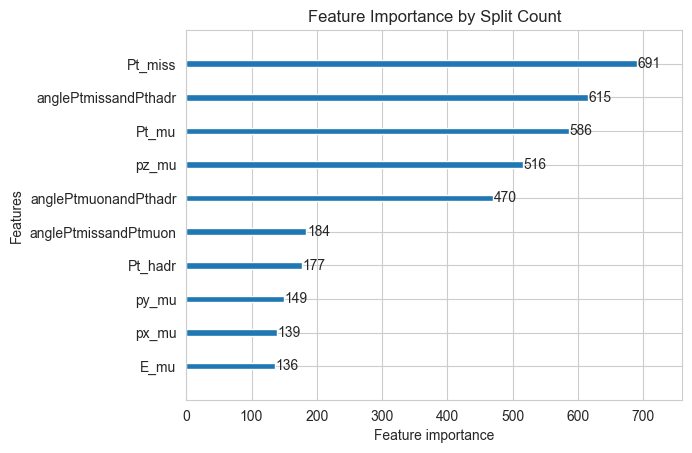

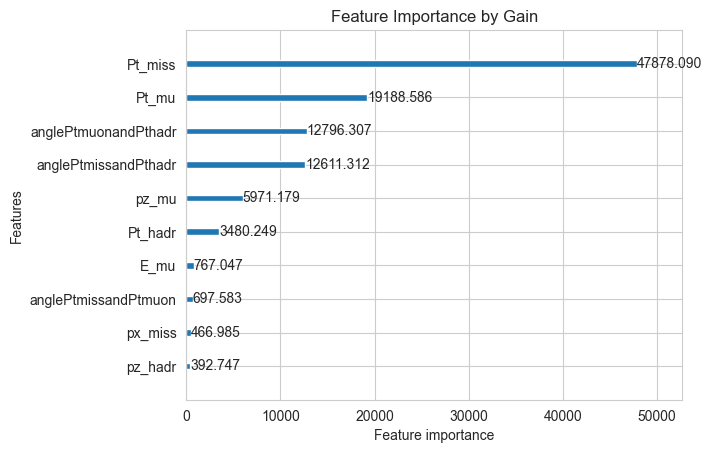

0.8087954110899815 0.2778021015763783


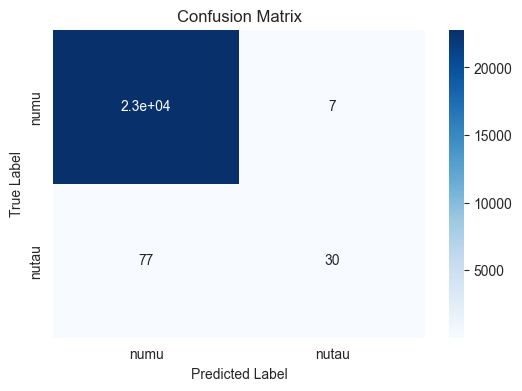

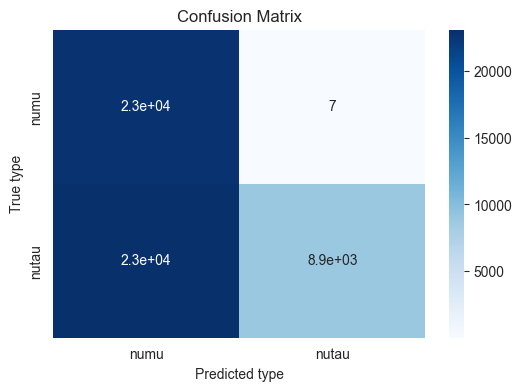

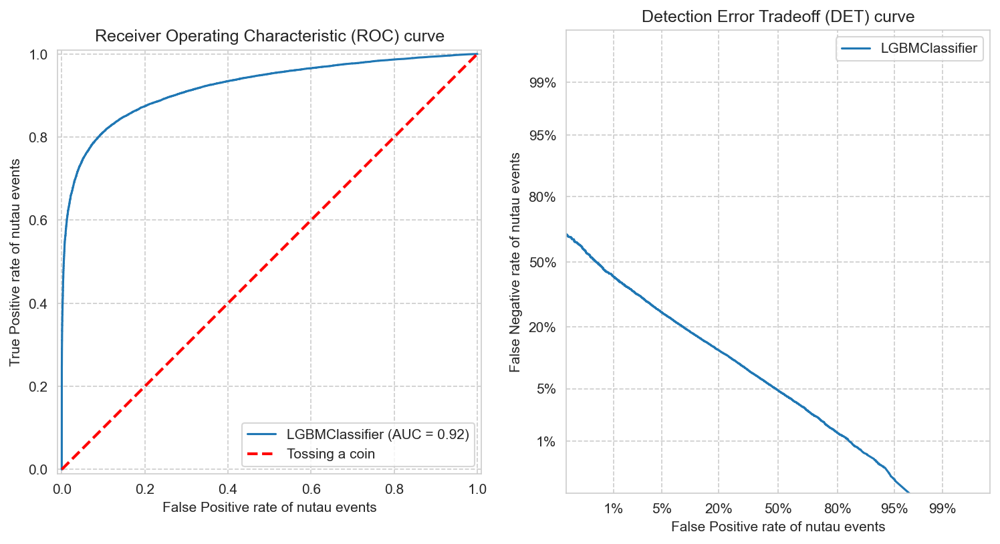

0 times...
50 times...
100 times...
150 times...
Model: BDT  	 f1-score:  [0.69175573 0.93607227]
{'learning_rate': 0.011172373994372296, 'num_leaves': 43, 'max_depth': 45, 'min_child_samples': 45, 'subsample': 0.6929062733108728, 'colsample_bytree': 0.7878850884088073, 'n_estimators': 265, 'min_split_gain': 1, 'reg_lambda': 5}


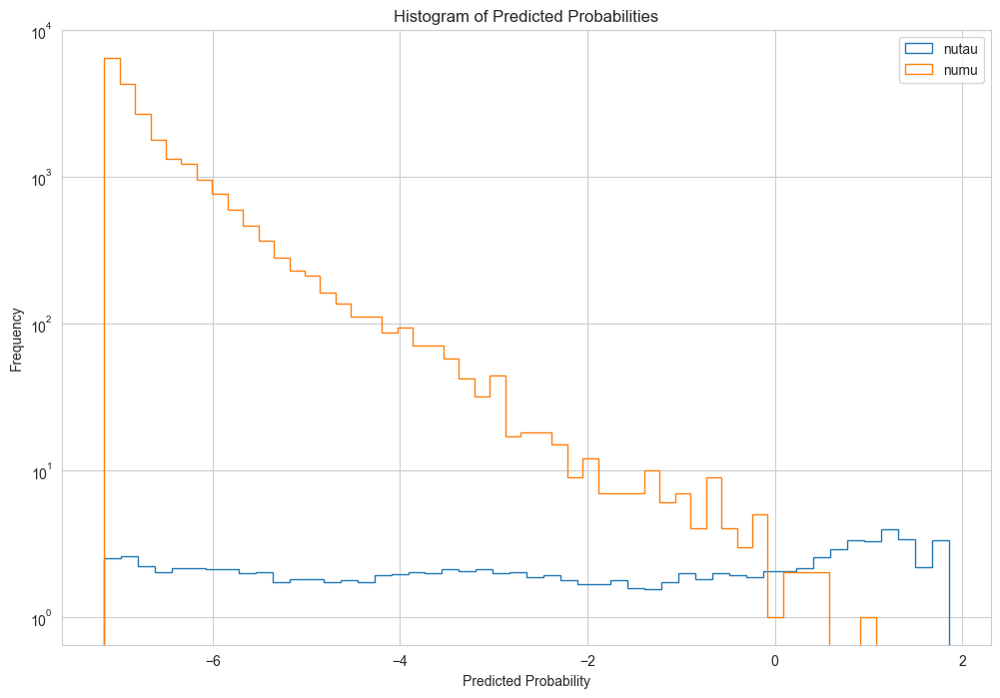

In [449]:
#, scale_pos_weight=len(y_train[y_train == 0])/len(y_train[y_train == 1])
#train_and_get_results(X, y, weights, SMOTE_on=True)
train_and_get_results(X_no_IP, y_no_IP, weights_no_IP, SMOTE_on=True)

[     0      2      3 ... 273878 273879 273880] [     1      6     12 ... 273854 273862 273869]
[     1      2      3 ... 273877 273879 273880] [     0      4     15 ... 273842 273870 273878]
[     0      1      3 ... 273878 273879 273880] [     2      7      8 ... 273853 273858 273872]
[     0      1      2 ... 273877 273878 273880] [     3      5      9 ... 273867 273873 273879]
[     0      1      2 ... 273878 273879 273880] [    18     24     28 ... 273866 273868 273876]
[     0      1      2 ... 273876 273878 273879] [    17     19     22 ... 273875 273877 273880]


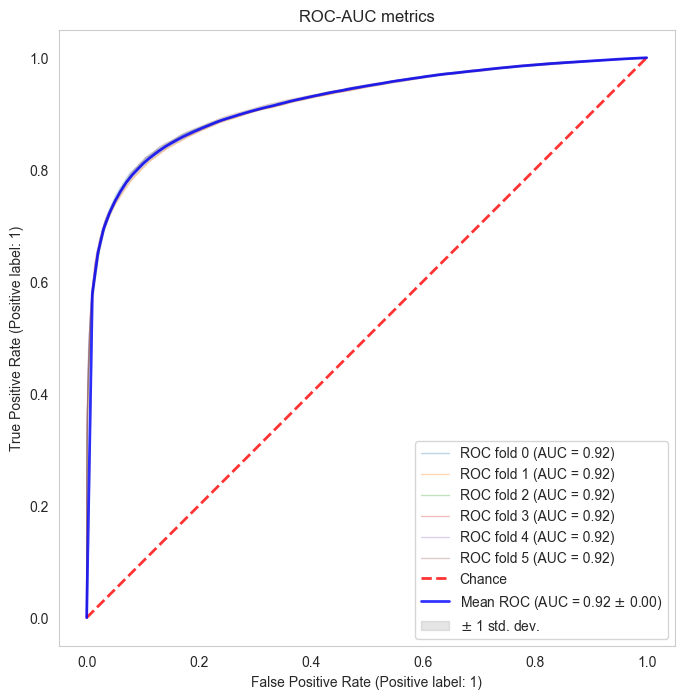

In [381]:
params = {'learning_rate': 0.03835053999502018, 'num_leaves': 69, 'max_depth': 35, 'min_child_samples': 9, 'subsample': 0.7815145670939458, 'colsample_bytree': 0.9306769534182271, 'n_estimators': 32, 'min_split_gain': 8, 'reg_lambda': 5}
roc_auc_plot(X_no_IP.values, y_no_IP, weights_no_IP, params)

In [377]:
cv = StratifiedKFold(n_splits=6)
[(sum(x), sum(y)) for x, y in cv.split(X_no_IP.values, y_no_IP)]

[(33926464645, 3578799495),
 (32857636440, 4647627700),
 (31788808235, 5716455905),
 (30719980030, 6785284110),
 (29651000187, 7854263953),
 (28582431163, 8922832977)]

In [444]:
len(X.columns)

18

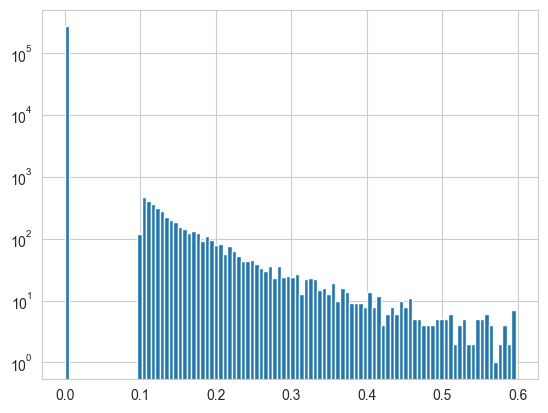

In [193]:
X["IP"].hist(bins = 100)
plt.yscale("log")

In [236]:
X_no_IP

,px_mu,py_mu,pz_mu,E_mu,px_hadr,py_hadr,pz_hadr,E_hadr,px_miss,py_miss,Pt_miss,Pt_hadr,Pt_mu,anglePtmissandPtmuon,anglePtmissandPthadr,anglePtmuonandPthadr,anglePhadrandPmuon
0,-2.952162,-1.295885,32.178738,32.339856,3.093164,1.887705,48.459113,48.594410,-0.141002,-0.591819,0.608385,3.623685,3.224063,127.100586,45.204036,7.695378,9.975898
1,-2.239126,0.132467,42.506953,42.566098,2.443480,-0.487620,28.774850,28.882527,-0.204354,0.355153,0.409749,2.491659,2.243041,123.301699,48.798318,7.899983,7.951765
2,-0.460824,-0.212179,19.477545,19.484161,0.400450,0.303924,36.072697,36.076200,0.060373,-0.091746,0.109828,0.502723,0.507325,81.376000,86.150035,12.473964,2.278157
9,-1.519569,-0.116323,30.378467,30.416684,1.592724,-0.006645,38.133878,38.167125,-0.073154,0.122968,0.143083,1.592737,1.524016,116.371073,59.012426,4.616501,5.259429
10,0.784613,2.244221,60.602432,60.649051,-0.792573,-1.898551,15.275498,15.413420,0.007959,-0.345670,0.345761,2.057345,2.377424,20.589442,156.022276,3.388282,9.914099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325400,-0.003636,-1.657461,48.572594,48.600886,0.199136,2.953895,39.472310,39.583183,-0.195501,-1.296434,1.311091,2.960600,1.657466,171.550146,4.718778,3.731076,6.240931
325407,0.087069,0.343306,2.225047,2.253075,-1.885280,0.538566,56.902990,56.936760,1.798211,-0.881872,2.002813,1.960698,0.354178,78.107198,10.181097,91.711705,9.197535
325408,0.280847,0.314119,18.451533,18.456363,0.213605,2.838239,20.613879,20.809451,-0.494452,-3.152358,3.190900,2.846265,0.421363,32.884904,4.610351,142.504745,6.869513
325409,-0.696428,-0.278972,14.252249,14.271989,3.565326,-1.470340,35.838602,36.045511,-2.868897,1.749312,3.360158,3.856611,0.750225,126.797431,8.961525,44.241044,8.561777


KeyError: "None of [Index([ 24631, 262356, 180852,  47686, 202442, 112402,  78345, 146116,  22540,\n       255776,\n       ...\n       249087, 118157,  76748, 262032, 208309, 210335,  41105, 166559, 213515,\n       269748],\n      dtype='int64', length=273290)] are in the [columns]"

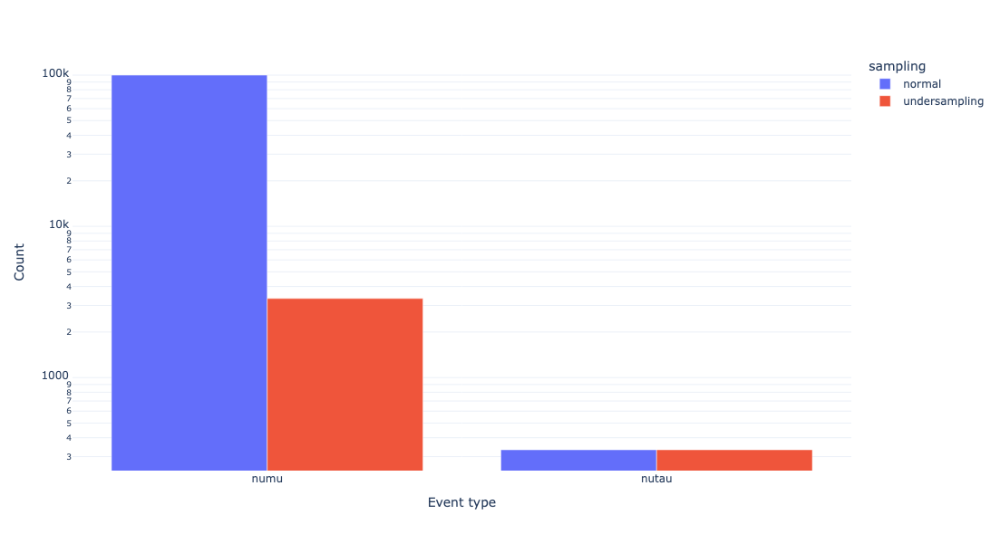

In [34]:
import plotly.graph_objects as go
import plotly.express as px
# Count the occurrences of 0s and 1s
unique, counts = np.unique(pd.Series(y).map({0: "numu", 1: "nutau"}), return_counts=True)


smpl = pd.DataFrame({"type": np.array(["numu", "numu", "nutau", "nutau"]), 
                     "count": np.array([1e5, 1e5//30, 1e5//300, 1e5//300]), 
                     "sampling": np.array(["normal", "undersampling", "normal", "undersampling"])})
# Create a bar chart with plotly
# fig = go.Figure([go.Bar(x=np.array(["numu", "numu", "nutau", "nutau"]), y=np.array([1e5, 1e5//30, 1e5//300, 1e5//300]))])

# Update layout for better visualization

fig = px.bar(smpl, x="type", y="count",
             color='sampling', barmode='group')
fig.update_layout(
    # title="Count of 0s and 1s in the Array",
    xaxis_title="Event type",
    yaxis_title="Count",
    xaxis=dict(tickmode="array", tickvals=[0, 1]),
    template="plotly_white",
)
fig.update_yaxes(type="log")
fig.update_layout(width = 800, height = 600)
fig.show()

In [37]:
12000//300

40

In [395]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

# Example DataFrame: replace with your actual dataset
# Assume X is the feature matrix and y is the label vector
# X = your feature matrix, y = your labels
# X = np.random.rand(100, 10)  # Example random data
# y = np.random.choice(['class_1', 'class_2'], size=100)  # Example labels

# # Step 1: Normalize the features
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# # Step 2: Apply t-SNE
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X)

# Step 3: Convert the result to a DataFrame for easy plotting
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne['label'] = y



<Figure size 800x600 with 0 Axes>

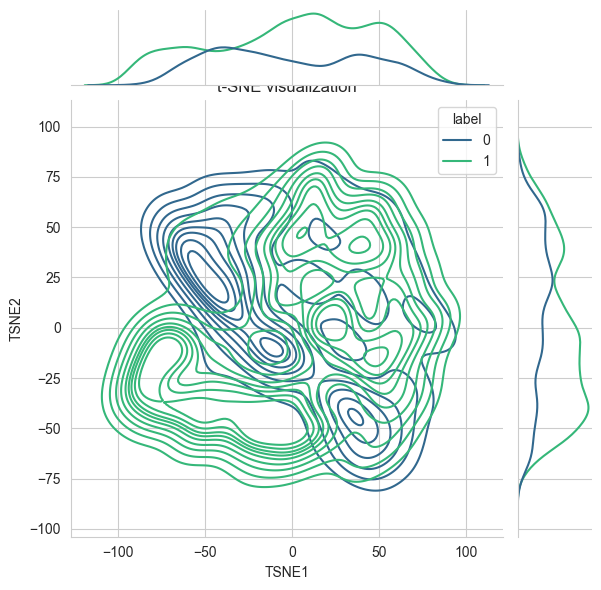

In [333]:
# Step 4: Plot the t-SNE result
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='label', palette='viridis', kind="kde")
plt.title("t-SNE visualization")
plt.show()


<Figure size 800x600 with 0 Axes>

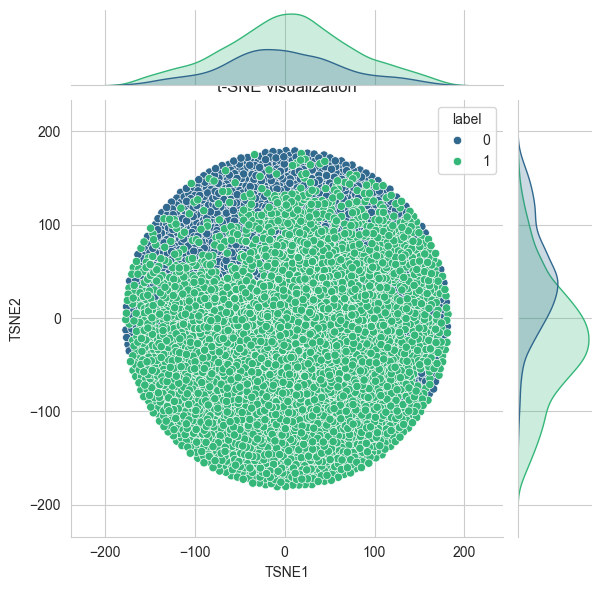

In [336]:
# Step 4: Plot the t-SNE result perp=0.6
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()


<Figure size 800x600 with 0 Axes>

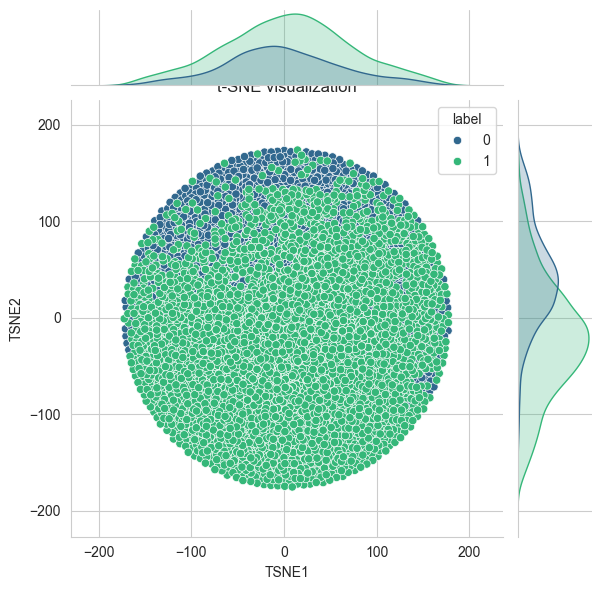

In [338]:
# Step 4: Plot the t-SNE result perp=0.8
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()


<Figure size 800x600 with 0 Axes>

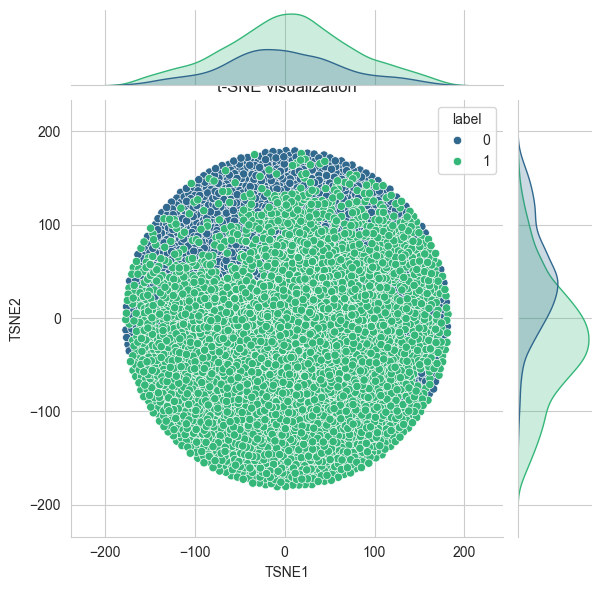

In [340]:
# Step 4: Plot the t-SNE result perp=0.1
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()


<Figure size 800x600 with 0 Axes>

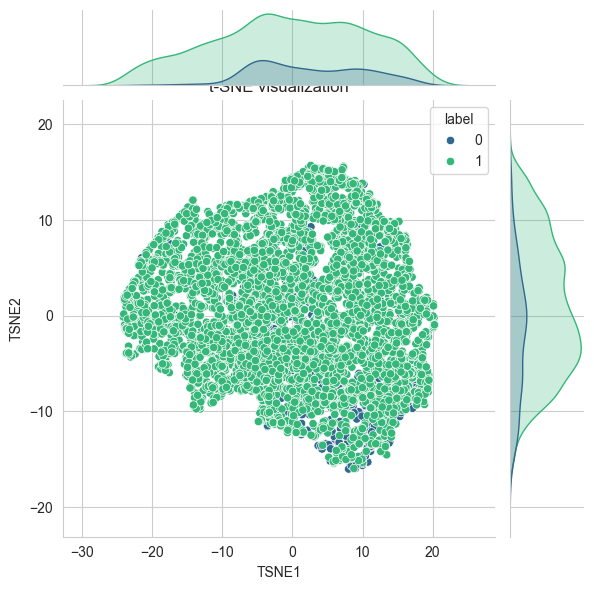

In [345]:
# Step 4: Plot the t-SNE result cut on pt_mu
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()


<Figure size 800x600 with 0 Axes>

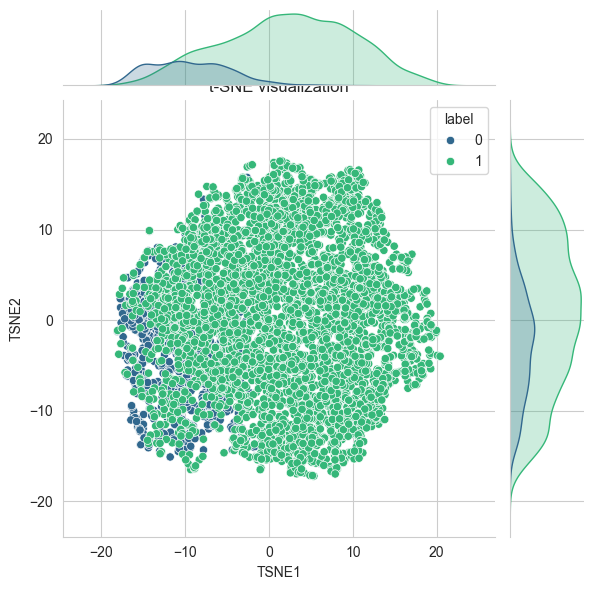

In [353]:
# Step 4: Plot the t-SNE result cut on pt_mu, transform
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()


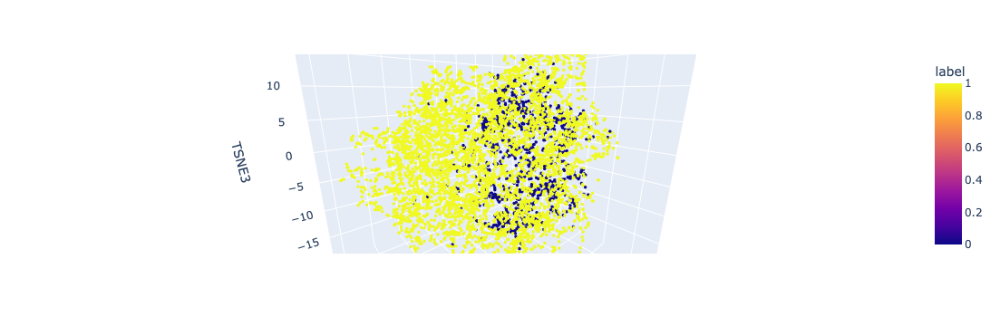

In [354]:
import plotly.express as px
fig_3d = px.scatter_3d(
    df_tsne, 'TSNE1', y='TSNE2', z='TSNE3',
    color=df_tsne.label, labels={'color': 'label'}
)
fig_3d.update_traces(marker_size=2)
fig_3d.show()

<Figure size 800x600 with 0 Axes>

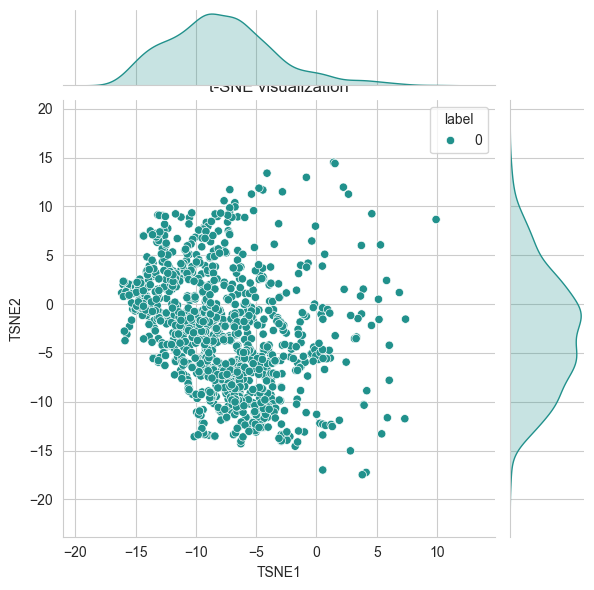

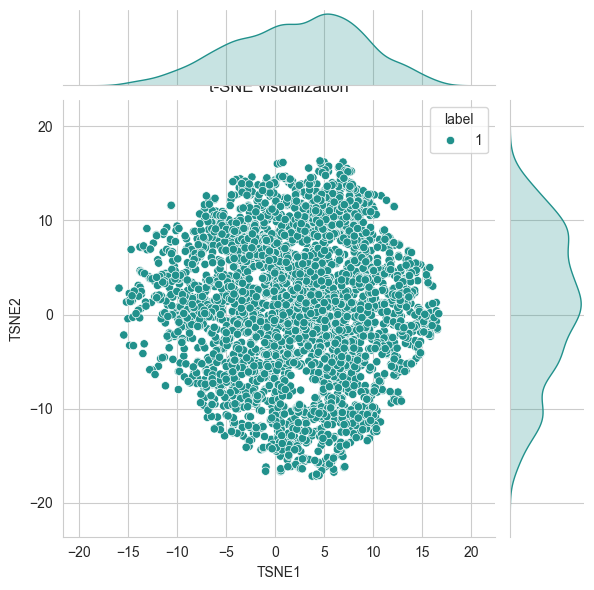

In [398]:
# Step 4: Plot the t-SNE result, problematic space
plt.figure(figsize=(8, 6))
sns.jointplot(data=df_tsne.query("label == 0"), x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()
sns.jointplot(data=df_tsne.query("label == 1"), x='TSNE1', y='TSNE2', hue='label', palette='viridis')
plt.title("t-SNE visualization")
plt.show()

# Tracking ML

In [53]:
pip install tensorboard

Note: you may need to restart the kernel to use updated packages.


In [35]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE  # For handling imbalance
from sklearn.datasets import make_classification

def train_rnn(X, y, weights):
    # X["label"] = y
    # X_tau = X.loc[X.label == 1].sample(len(X.loc[X.label == 0])//300)
    # X_mu = X.loc[X.label == 0].sample(len(X.loc[X.label == 0])//30)
    # X = pd.concat([X_mu, X_tau])
    # y = X["label"]
    # X = X.drop(columns = "label") 
    # weights = np.array([30.]*len(X_mu["px_mu"]) + [1.]*len(X_tau["px_mu"]))

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    
    X_train_resampled, y_train_resampled = X_train, y_train
    
    # Reshape data to be 3D for LSTM input (samples, time_steps, features)
    # Here, we assume time_steps = 1 since we don't have sequential data in this case
    X_train_resampled = np.expand_dims(X_train_resampled, axis=1)
    X_test = np.expand_dims(X_test, axis=1)
    
    # Normalize data (LSTMs generally perform better with scaled data)
    scaler = StandardScaler()
    X_train_resampled = scaler.fit_transform(X_train_resampled.reshape(-1, X_train_resampled.shape[-1])).reshape(X_train_resampled.shape)
    X_test = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
    
    # Build the RNN (LSTM) model
    model = Sequential()
    model.add(LSTM(64, input_shape=(X_train_resampled.shape[1], X_train_resampled.shape[2]), return_sequences=False))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))  # Binary classification output
    
    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    # Train the model
    history = model.fit(X_train_resampled, y_train_resampled, epochs=20, batch_size=64, 
                        validation_split=0.2, verbose=2)
    
    # Evaluate the model
    y_pred_proba = model.predict(X_test)
    y_pred = (y_pred_proba >= 0.5).astype(int)
    
    # Classification report and confusion matrix
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))


In [ ]:
train_rnn(X, y, weights)

Epoch 1/20


In [16]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}

class_weights_dict

{0: 1.0025431113092464, 1: 0.9974697580645161}

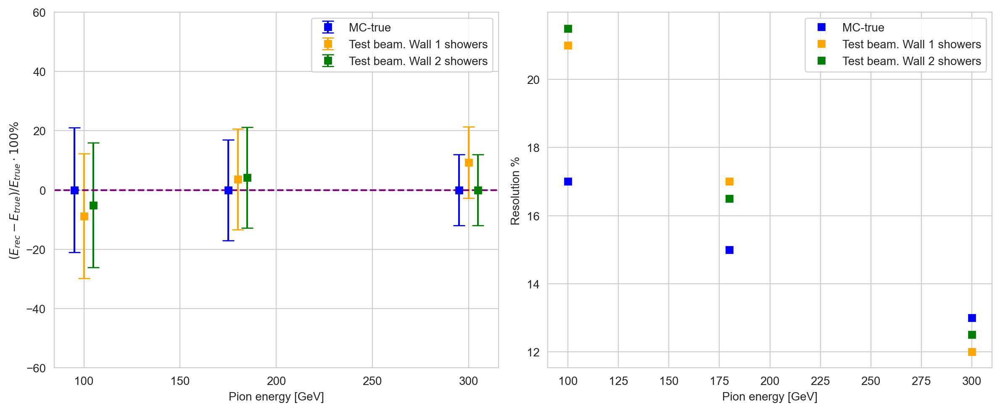

In [66]:
import numpy as np
import matplotlib.pyplot as plt

# Data for energy deviation plot (left)
pion_energy = np.array([95, 175, 295])
pion_energy_wall1 = np.array([100, 180, 300])
pion_energy_wall2 = np.array([105, 185, 305])
energy_deviation_mc = np.array([0, 0, 0])
energy_deviation_wall1 = np.array([-8.77, 3.68, 9.34])
energy_deviation_wall2 = np.array([-5.09434, 4.24528, 0.0])
#energy_deviation_wall3 = np.array([0, 3, -7, -5])


# Data for resolution plot (right)
resolution_mc = np.array([17, 15, 13])
resolution_wall1 = np.array([21, 17, 12])
resolution_wall2 = np.array([21.5, 16.5, 12.5])
#resolution_wall3 = np.array([32, 27, 22, 24])

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi = 200)

# Left plot: Energy Deviation
ax1.errorbar(pion_energy, energy_deviation_mc, yerr=errors, fmt='s', label='MC-true', color='blue', capsize=5)
ax1.errorbar(pion_energy_wall1, energy_deviation_wall1, yerr=errors, fmt='s', label='Test beam. Wall 1 showers', color='orange', capsize=5)
ax1.errorbar(pion_energy_wall2, energy_deviation_wall2, yerr=errors, fmt='s', label='Test beam. Wall 2 showers', color='green', capsize=5)
#ax1.errorbar(pion_energy, energy_deviation_wall3, yerr=errors, fmt='s', label='Test beam. Wall 3 showers', color='red', capsize=5)

ax1.axhline(0, linestyle='--', color='purple')
ax1.set_xlabel("Pion energy [GeV]")
ax1.set_ylabel(r'$(E_{rec} - E_{true}) / E_{true} \cdot 100\%$')
ax1.set_ylim([-60, 60])
ax1.legend()
ax1.grid(True)
pion_energy = np.array([100, 180, 300])
# Right plot: Resolution
ax2.errorbar(pion_energy, resolution_mc, fmt='s', label='MC-true', color='blue')
ax2.errorbar(pion_energy, resolution_wall1, fmt='s', label='Test beam. Wall 1 showers', color='orange')
ax2.errorbar(pion_energy, resolution_wall2, fmt='s', label='Test beam. Wall 2 showers', color='green')
#ax2.errorbar(pion_energy, resolution_wall3, fmt='s', label='Test beam. Wall 3 showers', color='red')

ax2.set_xlabel("Pion energy [GeV]")
ax2.set_ylabel("Resolution %")
#ax2.set_ylim([0, 40])
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.savefig("res.pdf")
plt.show()


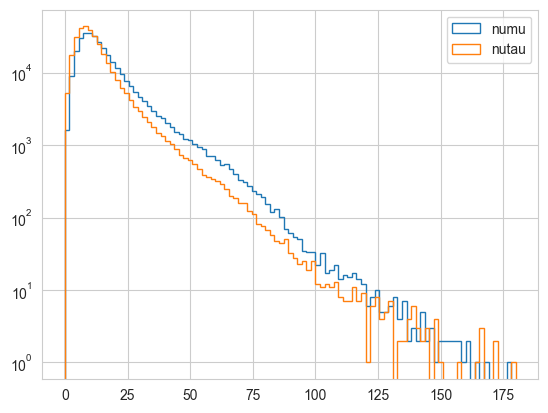

In [473]:
numu_angle = df_vis.query("label == 'numu'")["anglePhadrandPmuon"]
nutau_angle = df_vis.query("label == 'nutau'")["anglePhadrandPmuon"]
fig, ax = plt.subplots()
bins = np.linspace(0,180, 100)
ax.hist(numu_angle, bins = bins, histtype = 'step', label = 'numu')
ax.hist(nutau_angle, bins = bins, histtype = 'step', label = 'nutau')
ax.set_yscale("log")
ax.legend()

In [469]:
len(numu_angle[numu_angle < 45])/len(numu_angle)

1.0

In [474]:
len(nutau_angle[nutau_angle < 45])/len(nutau_angle)

0.9788390681323004

In [472]:
numu_angle[numu_angle > 10]

123322    10.244882
Name: Pt_mu, dtype: float64

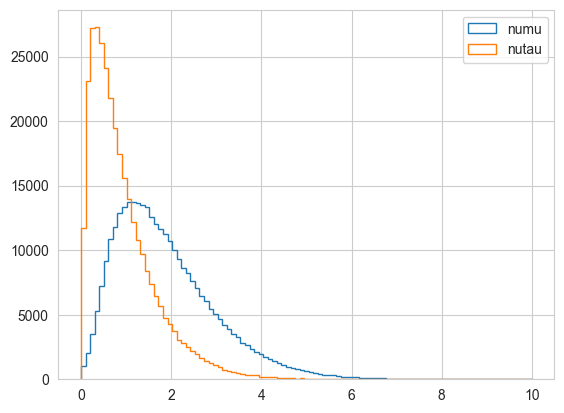

In [463]:
numu_angle = df_vis.query("label == 'numu'")["Pt_mu"]
nutau_angle = df_vis.query("label == 'nutau'")["Pt_mu"]
fig, ax = plt.subplots()
bins = np.linspace(0,10, 100)
ax.hist(numu_angle, bins = bins, histtype = 'step', label = 'numu')
ax.hist(nutau_angle, bins = bins, histtype = 'step', label = 'nutau')
ax.legend()

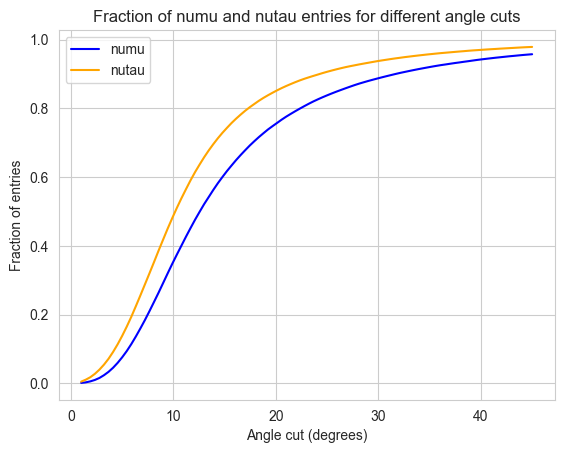

In [477]:
import numpy as np
import matplotlib.pyplot as plt

# Define the angle cuts from 180 to 5 degrees (in steps)
angle_cuts = np.linspace(45, 1, 100)

# Initialize arrays to store the fraction of entries for each cut
numu_fraction = []
nutau_fraction = []

# Loop over the angle cuts and calculate the fraction of entries
for cut in angle_cuts:
    # Fraction of entries for numu_angle below the current cut
    numu_fraction.append(np.sum(numu_angle <= cut) / len(numu_angle))
    
    # Fraction of entries for nutau_angle below the current cut
    nutau_fraction.append(np.sum(nutau_angle <= cut) / len(nutau_angle))

# Plot the fraction of entries as a function of the angle cuts
fig, ax = plt.subplots()
#ax.plot(angle_cuts, np.exp(numu_fraction), label='numu', color='blue')
#ax.plot(angle_cuts, np.exp(nutau_fraction), label='nutau', color='orange')

ax.plot(angle_cuts, numu_fraction, label='numu', color='blue')
ax.plot(angle_cuts, nutau_fraction, label='nutau', color='orange')

# Customize the plot
ax.set_xlabel('Angle cut (degrees)')
ax.set_ylabel('Fraction of entries')
ax.set_title('Fraction of numu and nutau entries for different angle cuts')
ax.legend()

plt.show()
